**Principal Componennt Analysis**

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


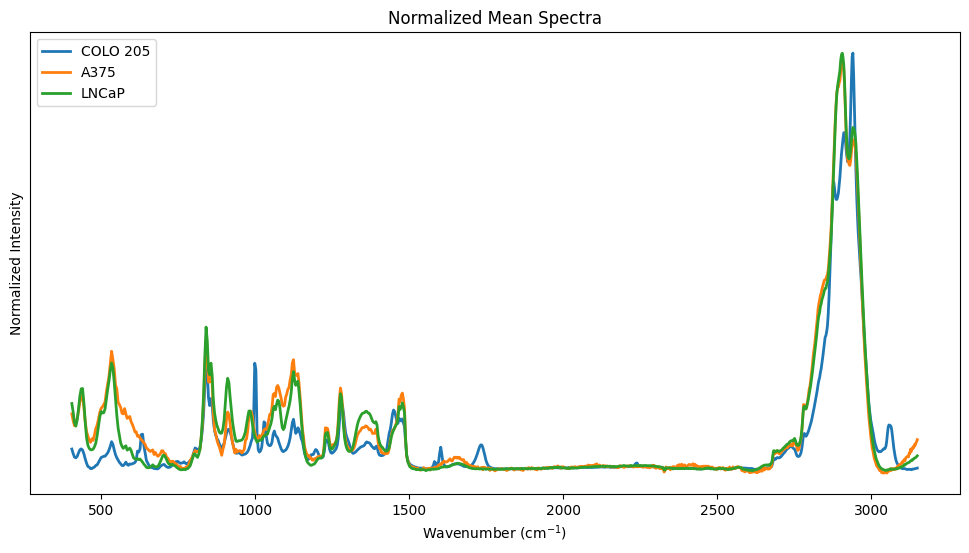

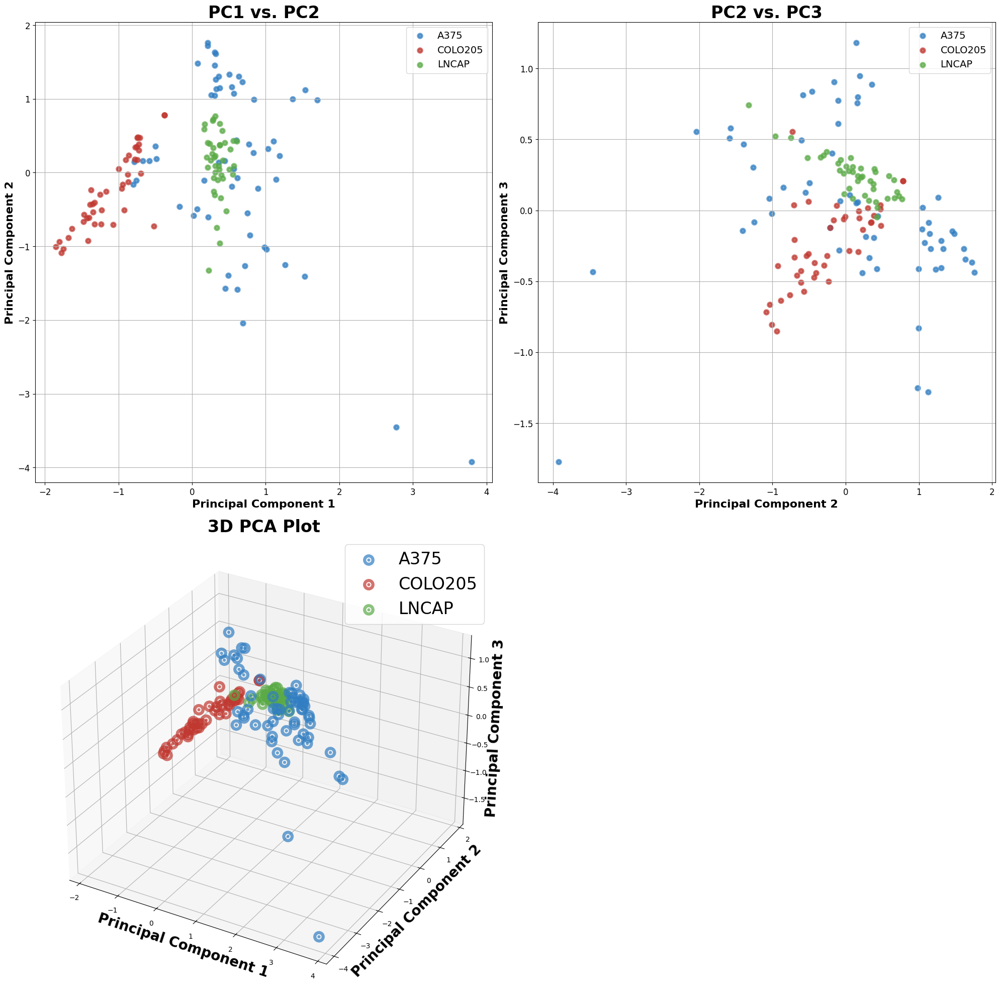

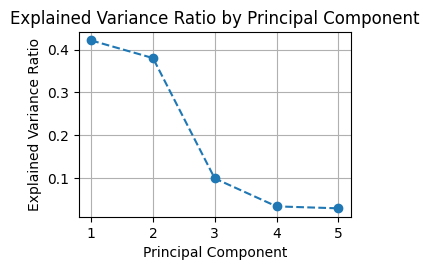

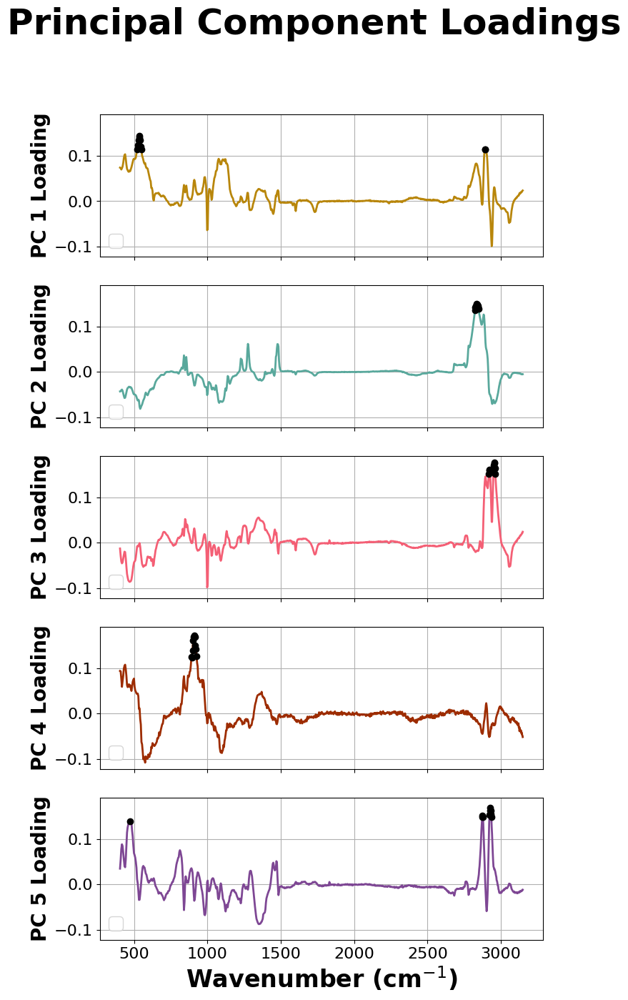

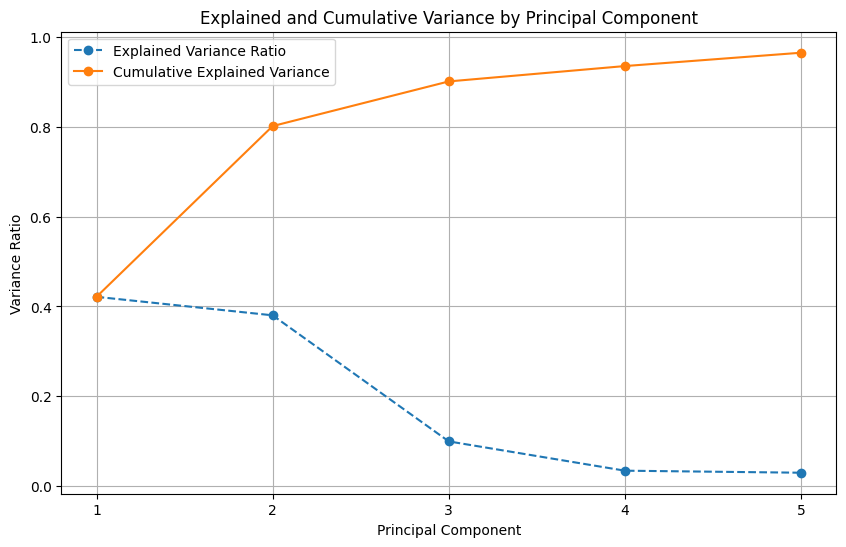

<Figure size 640x480 with 0 Axes>

In [ ]:
## PCA with min max normalization

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import correlate
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.metrics import mean_absolute_error, confusion_matrix, ConfusionMatrixDisplay, classification_report
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.preprocessing import StandardScaler
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.model_selection import train_test_split

drive.mount('/content/drive')

# Load the data
file_path = '/content/drive/My Drive/cancer_exosome/PCA/AllSpectra.csv'
df = pd.read_csv(file_path)

# Extract spectra data
spectra = df.iloc[:, 1:].values
wavenumbers = df.iloc[:, 0].values

# Perform min_max normalization on each array
def min_max_norm(array, min_index, max_index, min_val=0, max_val=1):
    min_val_actual = array[min_index]
    max_val_actual = array[max_index]
    norm_arr = (array - min_val_actual) / (max_val_actual - min_val_actual) * (max_val - min_val) + min_val
    return norm_arr

norm_spectra = np.zeros(spectra.shape)
for j in range(spectra.shape[1]):
    temp = spectra[:, j]
    max_index = np.argmax(temp)
    min_index = 444  # Preset minimum index for cell-silent region, adjust if necessary
    norm_temp = min_max_norm(temp, min_index, max_index)
    norm_spectra[:, j] = norm_temp

# Check that the normalization is correct
plt.figure(figsize=(12, 6))
plt.style.use('default')
plt.plot(wavenumbers, np.mean(norm_spectra[:,:42],axis=1), label='COLO 205', linewidth=2)
plt.plot(wavenumbers, np.mean(norm_spectra[:,43:101],axis=1),label='A375', linewidth=2)
plt.plot(wavenumbers, np.mean(norm_spectra[:,102:142],axis=1), label='LNCaP', linewidth=2)
plt.title('Normalized Mean Spectra')
plt.xlabel('Wavenumber (cm$^{-1}$)')
plt.ylabel('Normalized Intensity')
plt.legend()
plt.yticks([])
plt.show()

num_colo = 43
num_a375 = 59
num_lncap = 41

# Array for labels
labels = np.array(['COLO205']*num_colo + ['A375']*num_a375 + ['LNCAP']*num_lncap)

# Reshape data to be (features, samples) by transposing where each row is spectrum and each column is feature
X = norm_spectra.T

# Perform PCA

pca = PCA(n_components=5)
pca_result = pca.fit_transform(X)

# Plot Princiapl Components
plt.figure(figsize=(20, 20))
colors = ['#317EC2','#C03830', '#5AAA46']

# PC1 vs. PC2
plt.subplot(2, 2, 1)
for i, label in enumerate(np.unique(labels)):
    mask = labels == label
    plt.scatter(pca_result[mask, 0], pca_result[mask, 1], label=label, alpha=0.7, linewidth=3, color=colors[i])
plt.xlabel('Principal Component 1',fontsize=16, weight='bold')
plt.ylabel('Principal Component 2',fontsize=16, weight='bold')
plt.title('PC1 vs. PC2',fontsize=24, weight='bold')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=14)
plt.grid(True)

# PC2 vs. PC3
plt.subplot(2, 2, 2)
for i, label in enumerate(np.unique(labels)):
    mask = labels == label
    plt.scatter(pca_result[mask, 1], pca_result[mask, 2], label=label, alpha=0.7, linewidth=3, color=colors[i])
plt.xlabel('Principal Component 2',fontsize=16, weight='bold')
plt.ylabel('Principal Component 3',fontsize=16, weight='bold')
plt.title('PC2 vs. PC3',fontsize=24, weight='bold')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=14)
plt.grid(True)

# 3D Plot
ax = plt.subplot(2, 2, 3, projection='3d')
for i, label in enumerate(np.unique(labels)):
    mask = labels == label
    ax.scatter(pca_result[mask, 0], pca_result[mask, 1], pca_result[mask, 2], label=label, alpha=0.7, linewidth=12, color=colors[i])

ax.set_xlabel('Principal Component 1',fontsize=20, weight='bold')
ax.set_ylabel('Principal Component 2',fontsize=20, weight='bold')
ax.set_zlabel('Principal Component 3',fontsize=20, weight='bold')
ax.set_title('3D PCA Plot',fontsize=24, weight='bold')
ax.legend(fontsize=24)
ax.dist=10
plt.tight_layout()
plt.show()

# Variance Plot
plt.subplot(2, 2, 4)
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_, marker='o', linestyle='--')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance Ratio by Principal Component')
plt.grid(True)

plt.tight_layout()
plt.show()

# Loadings Plot
num_pcs = 5
fig, axes = plt.subplots(num_pcs, 1, figsize=(8, 15), sharex=True, sharey=True)
plt.suptitle('Principal Component Loadings', fontsize=36, weight='bold')
components = pca.components_
n_top = 10
colors = [ 'darkgoldenrod', '#59a89c','#f45f75', '#9d2c00', '#7E4794']
# Plot the loadings for each PC
for i, component in enumerate(components):
    top_indeces = np.argsort(np.abs(component))[-n_top:][::-1]
    top_wavenumbers = wavenumbers[top_indeces]
    top_loadings = component[top_indeces]
    axes[i].plot(wavenumbers, pca.components_[i, :], color=colors[i], linewidth=2)
    axes[i].plot(top_wavenumbers, top_loadings, 'ko', linewidth = 5)

    axes[i].set_ylabel(f'PC {i+1} Loading', fontsize=20, weight='bold')
    axes[i].grid(True)
    axes[i].legend(loc='lower left', fontsize=18)
    axes[i].tick_params(axis='x', labelsize=16)
    axes[i].tick_params(axis='y', labelsize=16)
# Adjust layout for better spacing
plt.xlabel('Wavenumber (cm$^{-1}$)', fontsize=24, weight='bold')

# Combined Variance Plot
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_, marker='o', linestyle='--', label='Explained Variance Ratio')
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o', linestyle='-', label='Cumulative Explained Variance')
# Set x-ticks to be integers only (1, 2, 3, 4, 5)
plt.xticks(ticks=range(1, 6))
plt.xlabel('Principal Component')
plt.ylabel('Variance Ratio')
plt.title('Explained and Cumulative Variance by Principal Component')
plt.grid(True)
plt.legend()
plt.show()

# Adjust layout for better spacing
plt.tight_layout()
plt.show()


In [ ]:
## Generate weighted loadings for each wavenumber
# Initialize an array to store the loadings
loadings_array = np.zeros((num_pcs, len(wavenumbers)))


# Initialize an array to store the final results for each wavenumber
wavenumber_results = np.zeros(len(wavenumbers))

# Extract the explained variance ratio for each principal component
explained_variance = pca.explained_variance_ratio_

# Compute the sum of weighted loadings for each wavenumber
abs_loadings = np.abs(pca.components_)
weighted_loadings = abs_loadings * explained_variance[:, np.newaxis]
wavenumber_results = np.sum(weighted_loadings, axis=0)

# Save the results to a CSV file
results_df = pd.DataFrame({
    'Wavenumber': wavenumbers,
    'Weighted_Sum': wavenumber_results
})

results_df.to_csv('/content/drive/My Drive/cancer_exosome/PCA/wavenumber_results.csv', index=False)

print("Wavenumber results have been saved to wavenumber_results.csv")

Wavenumber results have been saved to wavenumber_results.csv


In [ ]:
# Feature Extracted PCA with min-max normalization

# Load Weighted loadings
results_df = pd.read_csv('/content/drive/My Drive/cancer_exosome/PCA/wavenumber_results.csv')

# Sort the DataFrame by the weighted sum in descending order
sorted_results_df = results_df.sort_values(by='Weighted_Sum', ascending=False)


# Choose percentage of wavenumbers to extract
wn_percentage = 0.1
top_num = int(wn_percentage * len(wavenumbers))

# Print the top wavenumbers ranked by the weighted sum
print("Top "+str(top_num)+ " Wavenumbers Ranked by Weighted Sum:")
top_wavenumbers_df = sorted_results_df.head(top_num)
print(top_wavenumbers_df)

# Convert top wavenumbers to an array
top_wavenumbers_array = top_wavenumbers_df['Wavenumber'].values

# Get indeces of top wavenumbers
top_indeces = np.array(top_wavenumbers_df.index)

# Select for features in the raw spectra from the top wavenumbers
spectra_features = spectra[top_indeces, :]
spec_dic = {'Spectra' +str(spec_num+1): spectra_features[:,spec_num] for spec_num in range(0,spectra.shape[1])}
spec_dic['Wavenumbers'] = wavenumbers[top_indeces]

# Write spectral features into .csv
spectra_features_df = pd.DataFrame(spec_dic)
spectra_features_df.to_csv('/content/drive/My Drive/cancer_exosome/PCA/spectra_features.csv', index=False)

Top 87 Wavenumbers Ranked by Weighted Sum:
     Wavenumber  Weighted_Sum
767    2888.030      0.103847
768    2890.540      0.100927
766    2885.520      0.100245
746    2834.620      0.094482
745    2832.040      0.094160
..          ...           ...
41      579.356      0.058686
179    1119.960      0.058239
42      583.552      0.057936
795    2957.280      0.057883
165    1068.660      0.057813

[87 rows x 2 columns]


**Spectral Similarity**

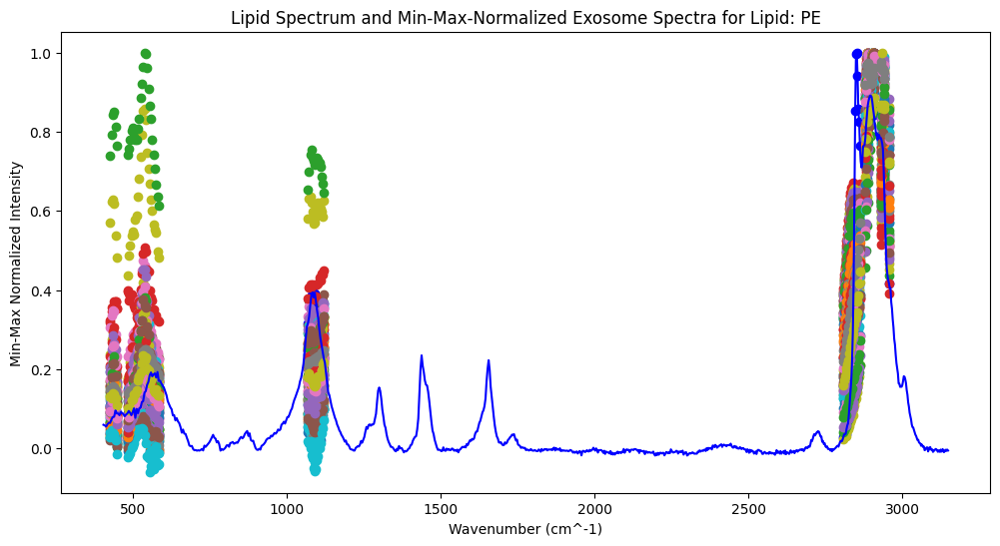

Average MSE for Lipid: PE is 0.05006822294699928


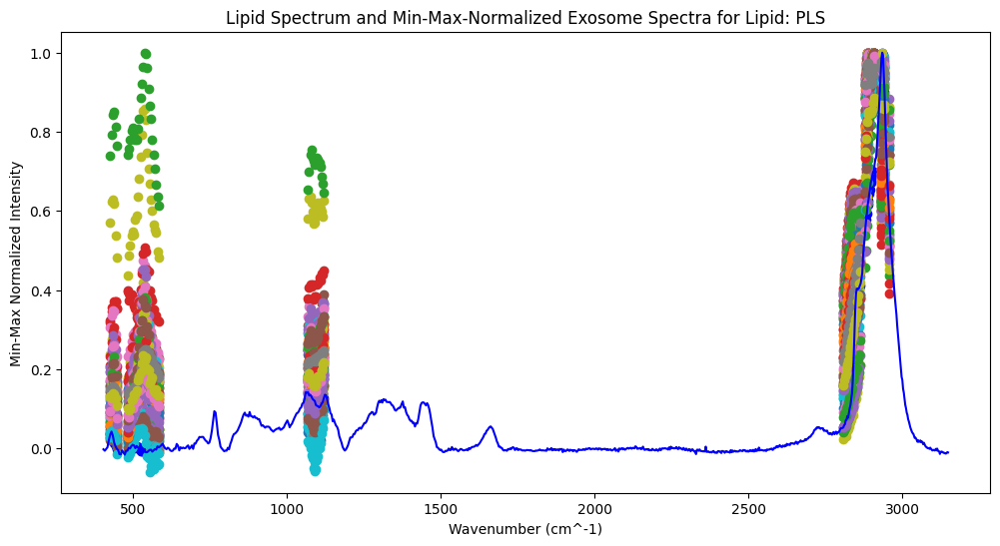

Average MSE for Lipid: PLS is 0.05214968942716931


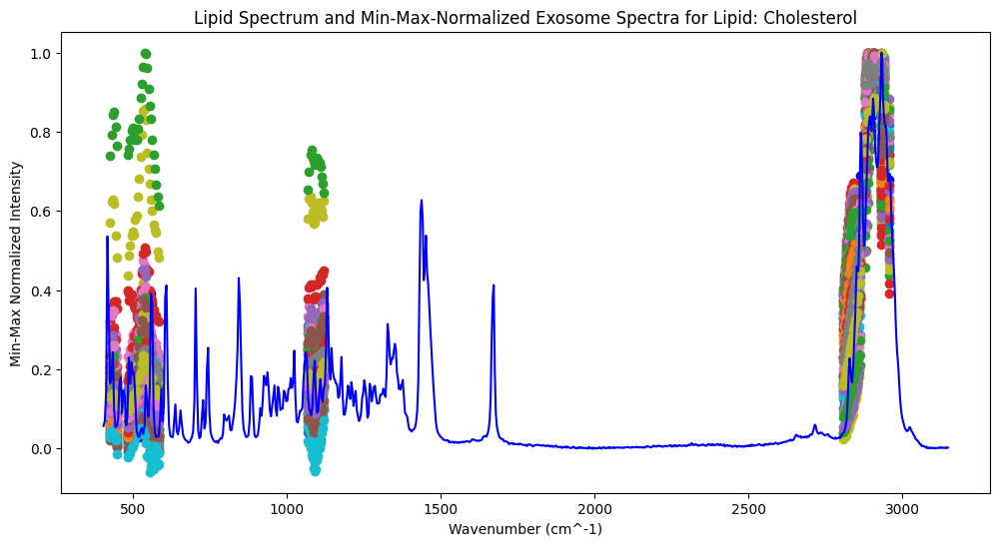

Average MSE for Lipid: Cholesterol is 0.03658858620444341


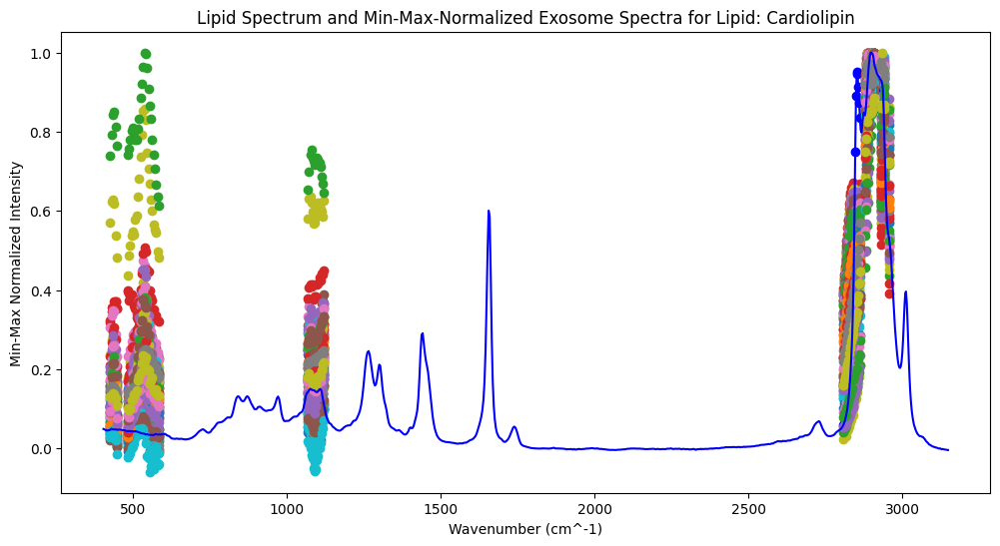

Average MSE for Lipid: Cardiolipin is 0.04621547776292022


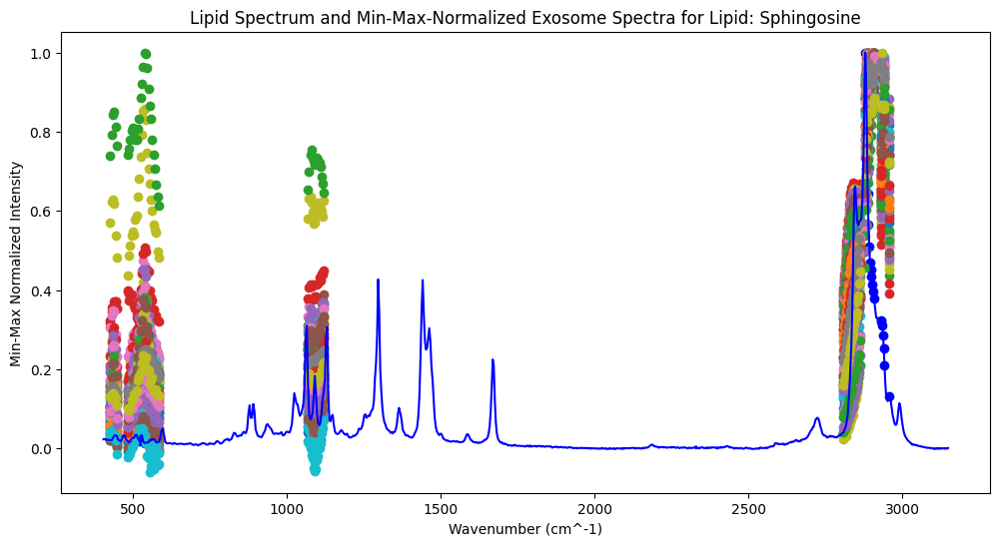

Average MSE for Lipid: Sphingosine is 0.079085244057029


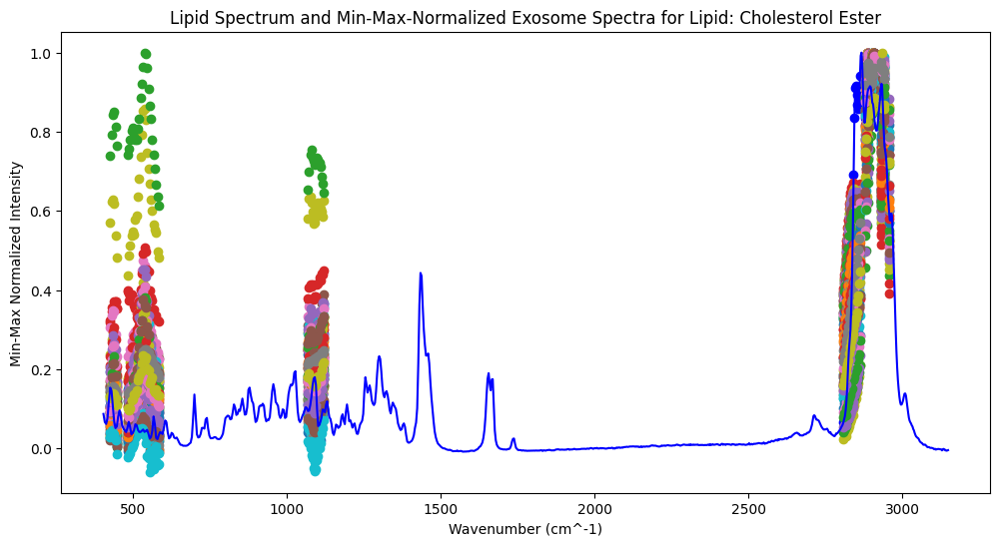

Average MSE for Lipid: Cholesterol Ester is 0.04635524864952557


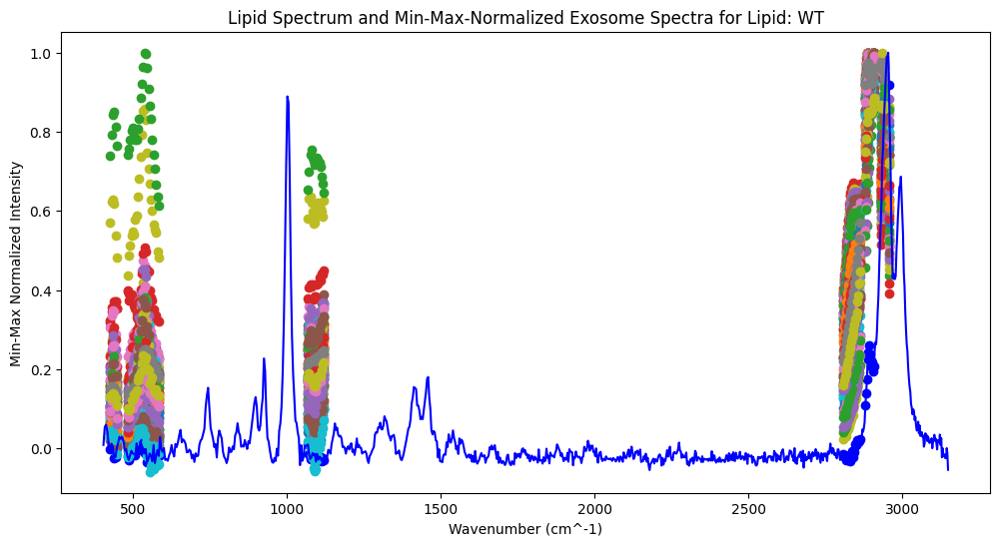

Average MSE for Lipid: WT is 0.14946605936208168


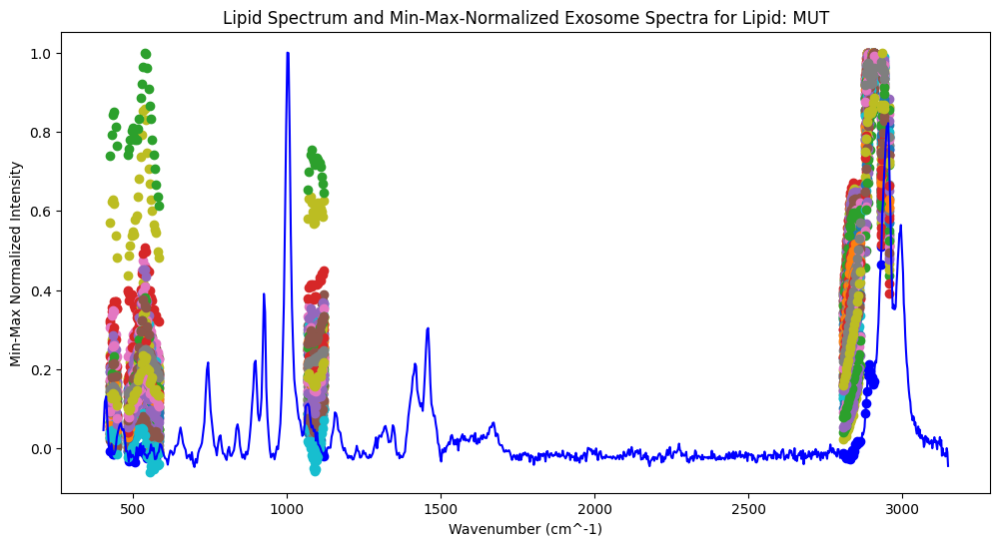

Average MSE for Lipid: MUT is 0.1544058829011807


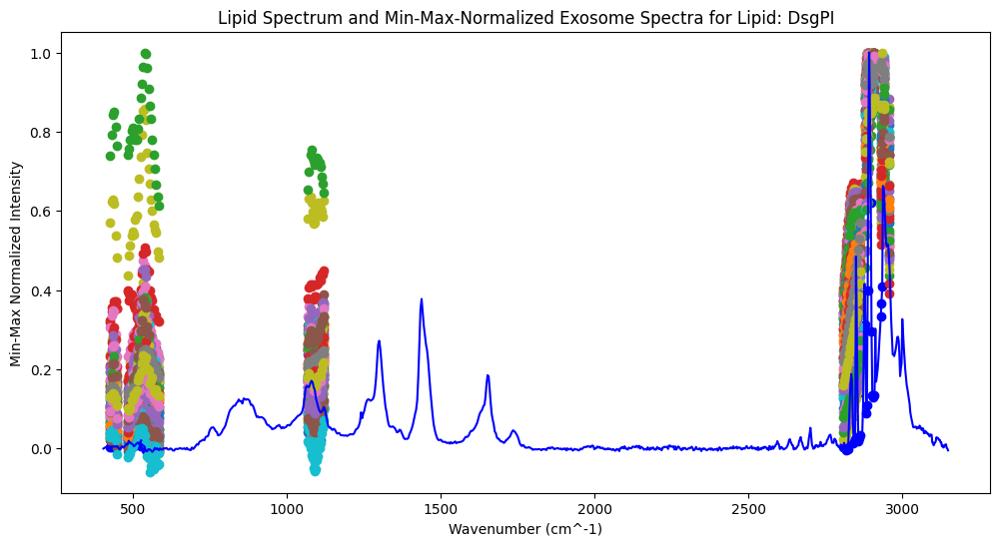

Average MSE for Lipid: DsgPI is 0.11063436139111771


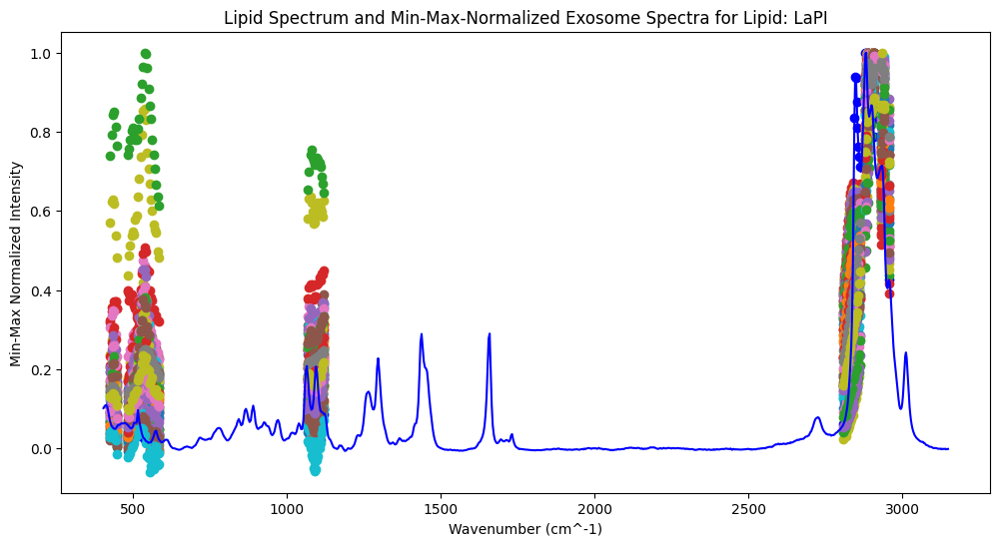

Average MSE for Lipid: LaPI is 0.046706353048943064


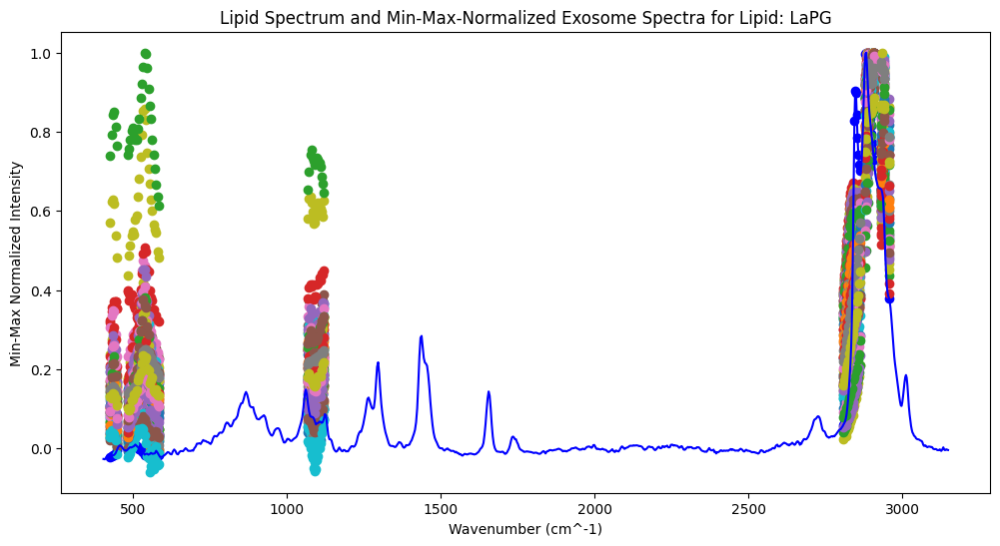

Average MSE for Lipid: LaPG is 0.05383209180386142


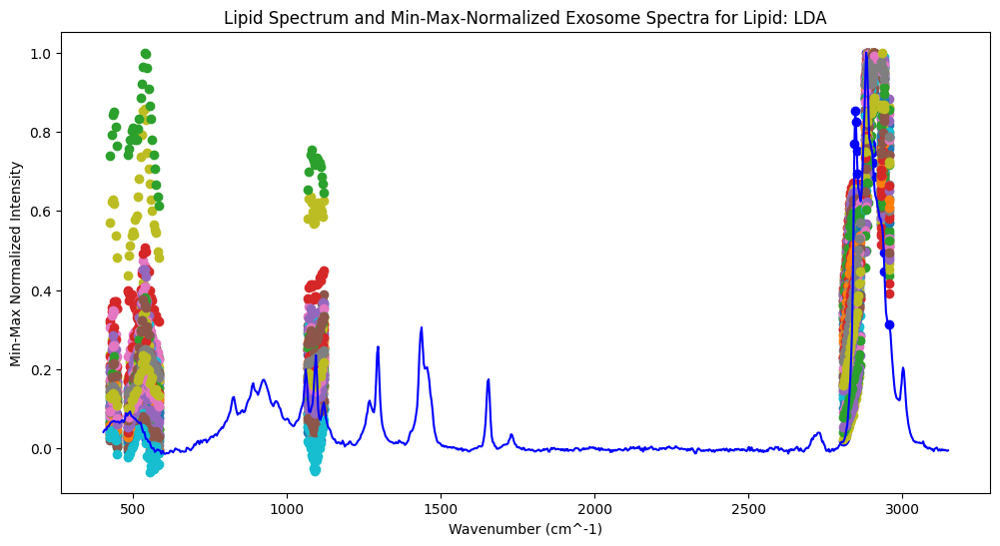

Average MSE for Lipid: LDA is 0.04977480651685221


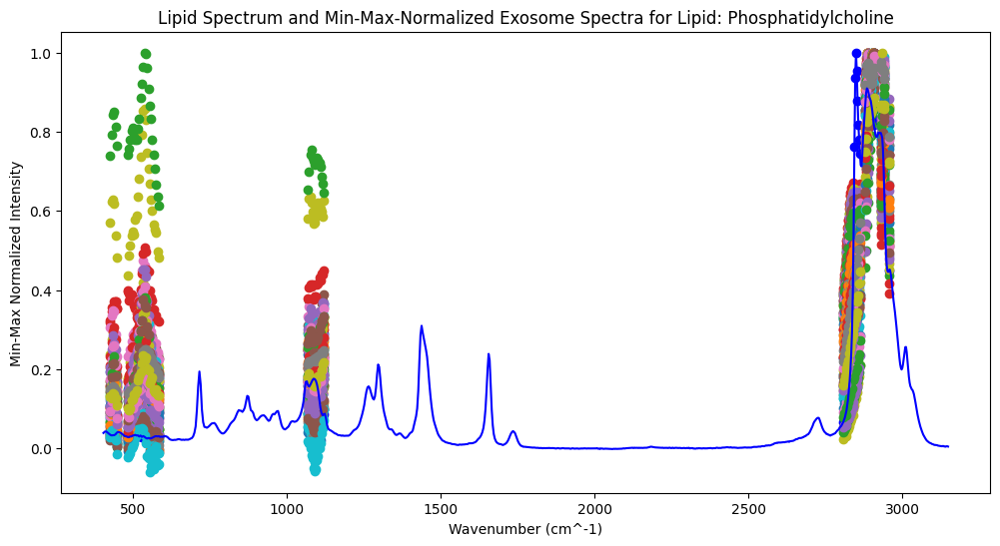

Average MSE for Lipid: Phosphatidylcholine is 0.048045584666254616


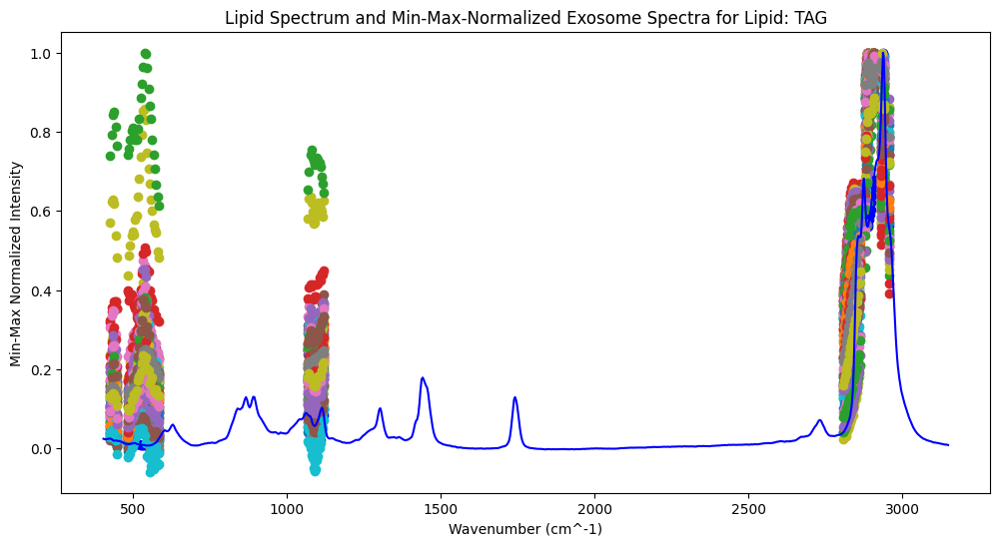

Average MSE for Lipid: TAG is 0.05631482368394858


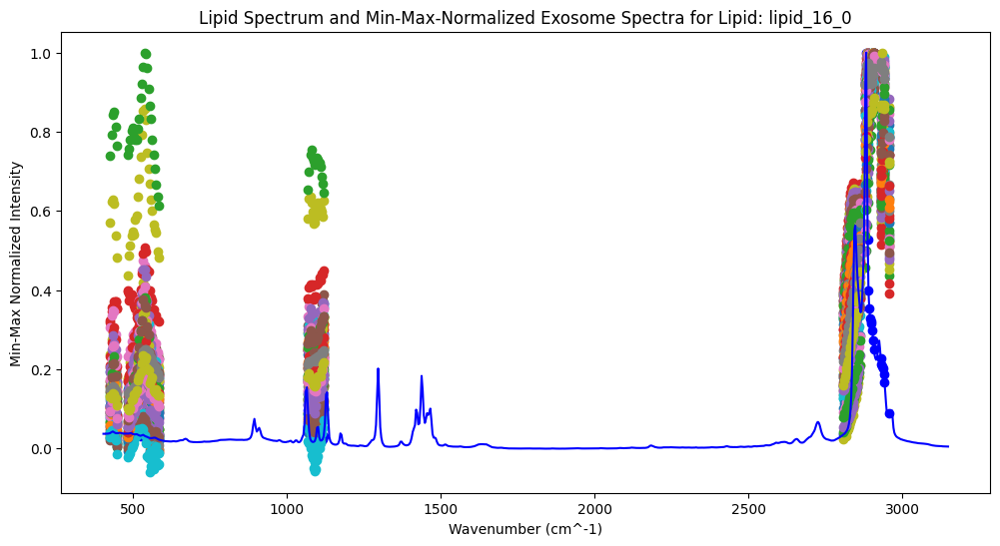

Average MSE for Lipid: lipid_16_0 is 0.10404976389710333


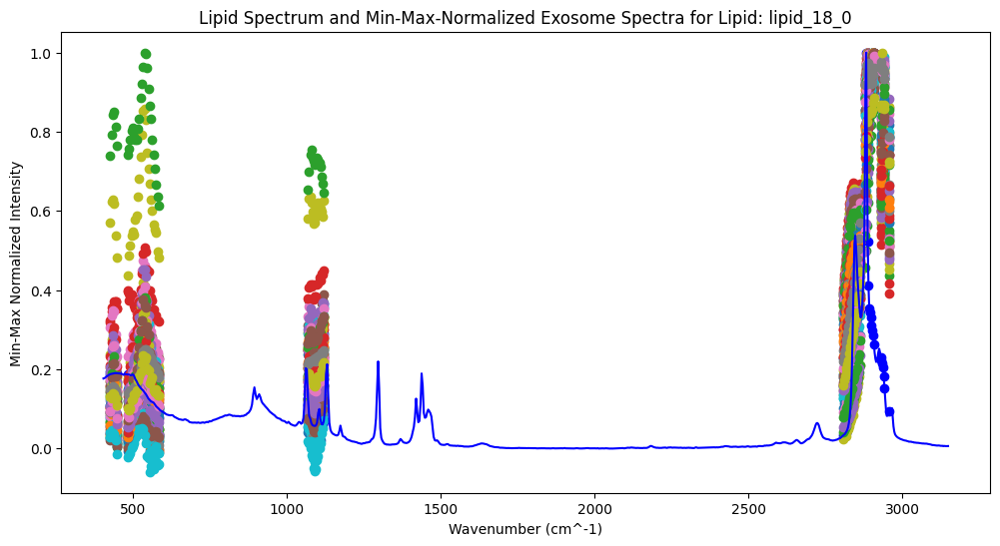

Average MSE for Lipid: lipid_18_0 is 0.09526980590019257


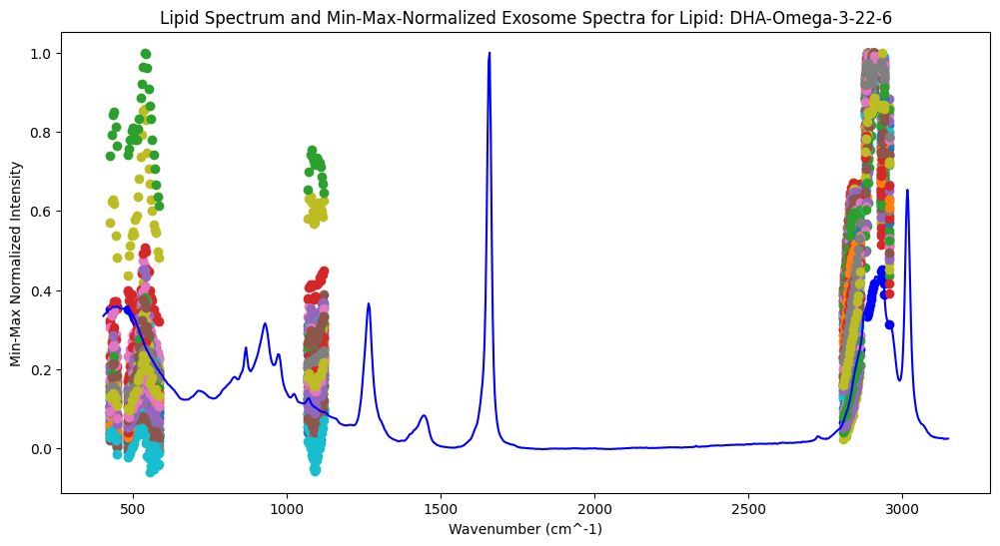

Average MSE for Lipid: DHA-Omega-3-22-6 is 0.09200921168641005


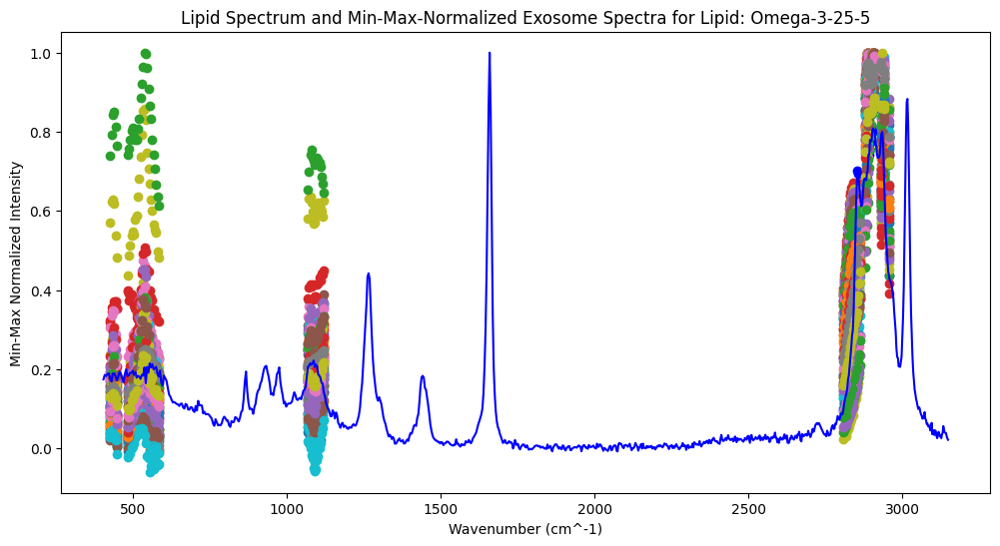

Average MSE for Lipid: Omega-3-25-5 is 0.02999827893193895


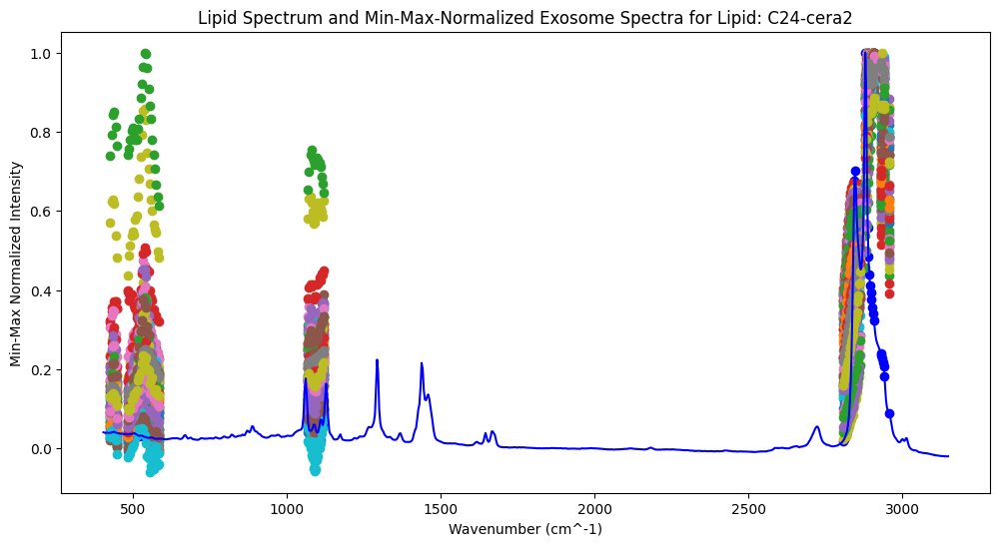

Average MSE for Lipid: C24-cera2 is 0.09368831498825755


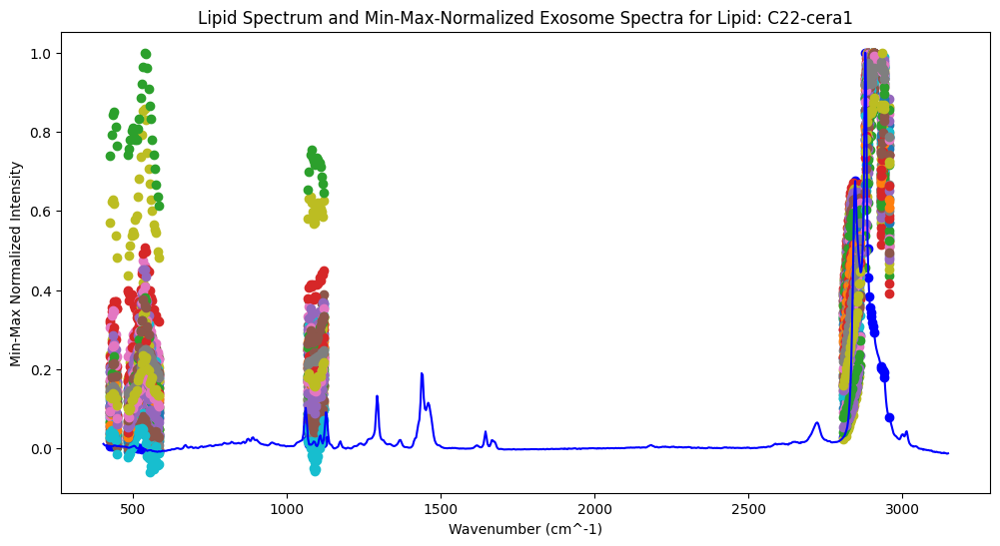

Average MSE for Lipid: C22-cera1 is 0.10519805864676972


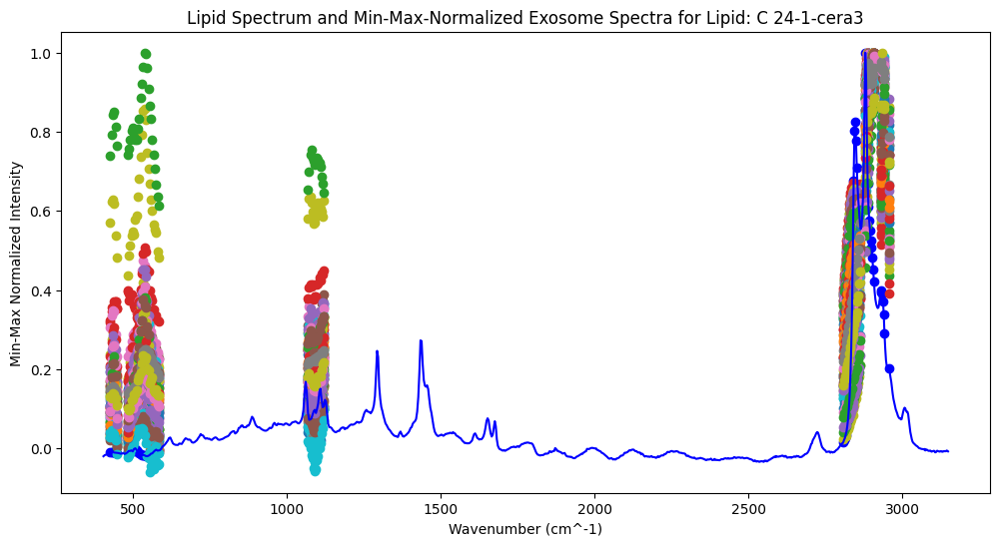

Average MSE for Lipid: C 24-1-cera3 is 0.07742778435739414


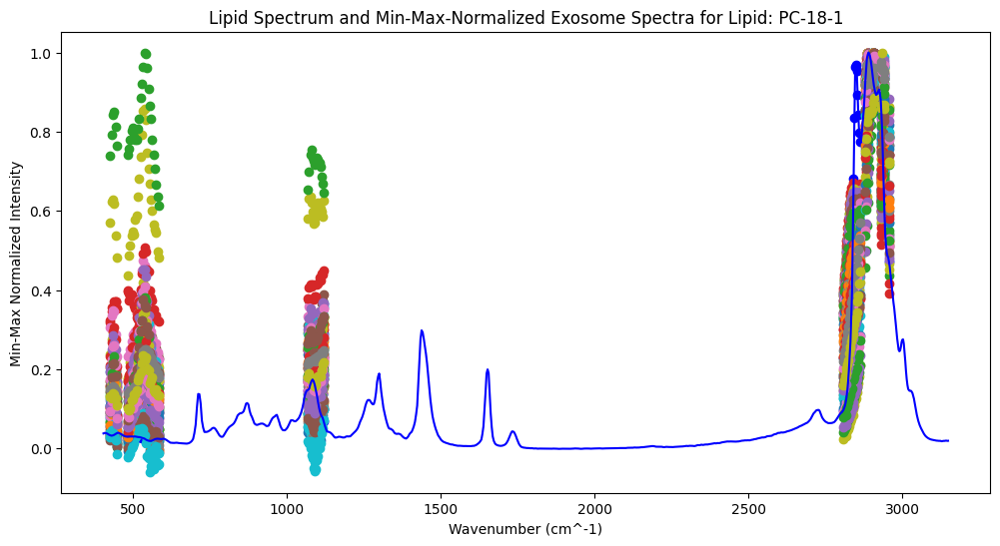

Average MSE for Lipid: PC-18-1 is 0.04872836101191024


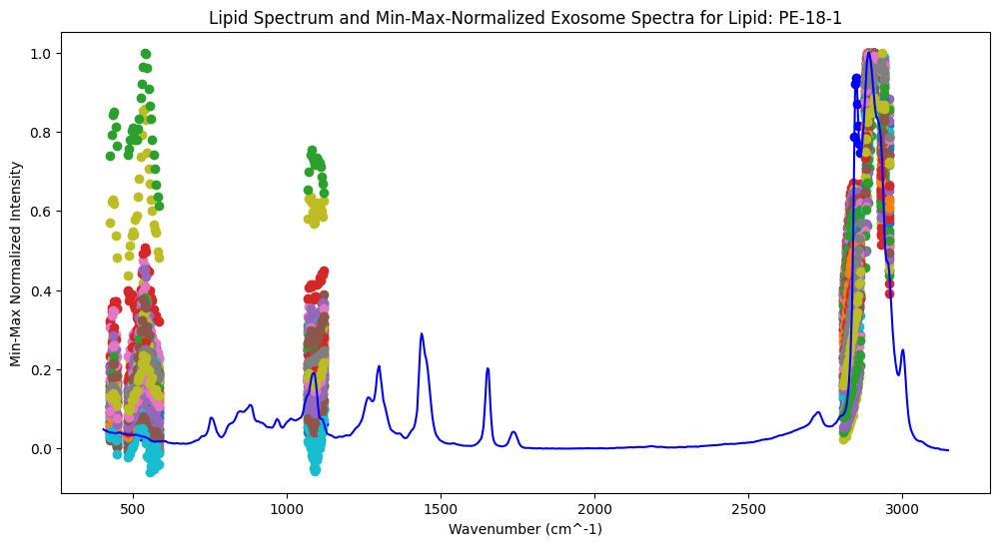

Average MSE for Lipid: PE-18-1 is 0.047321101966997826


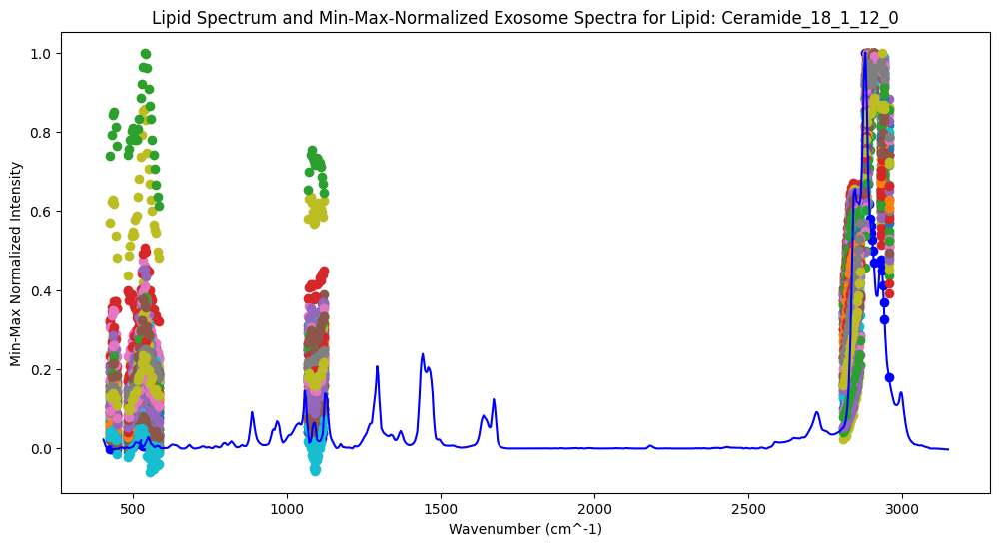

Average MSE for Lipid: Ceramide_18_1_12_0 is 0.06531417361610016


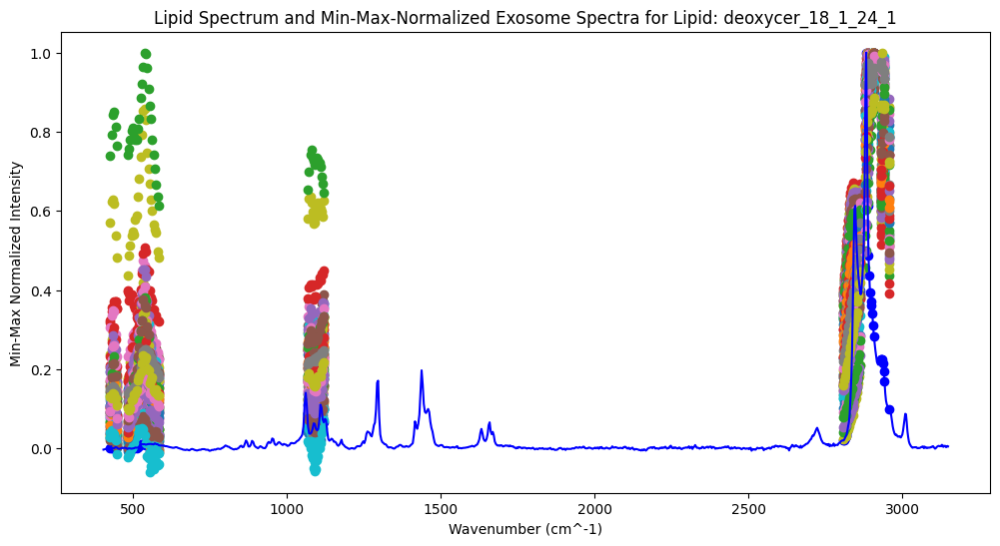

Average MSE for Lipid: deoxycer_18_1_24_1 is 0.09755360095381502


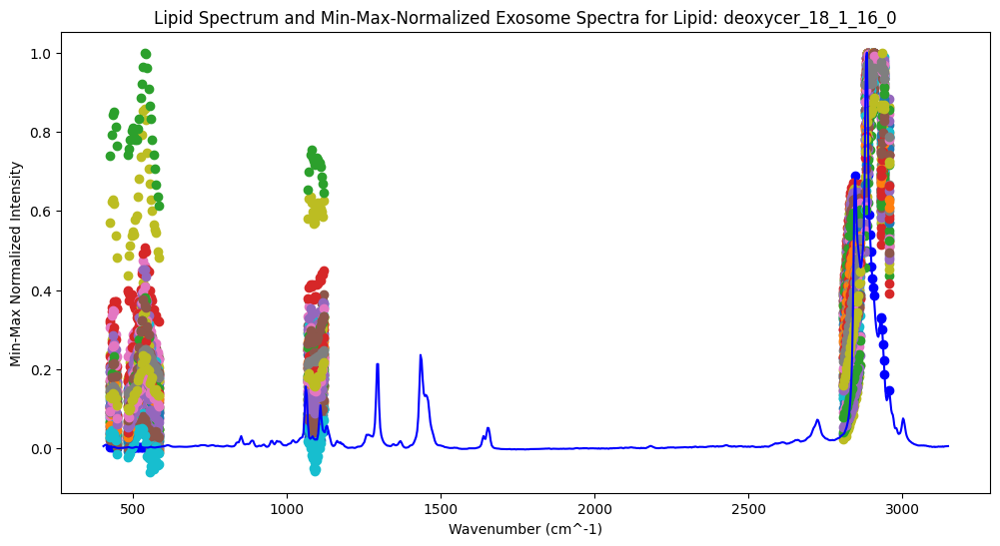

Average MSE for Lipid: deoxycer_18_1_16_0 is 0.08178456970045656


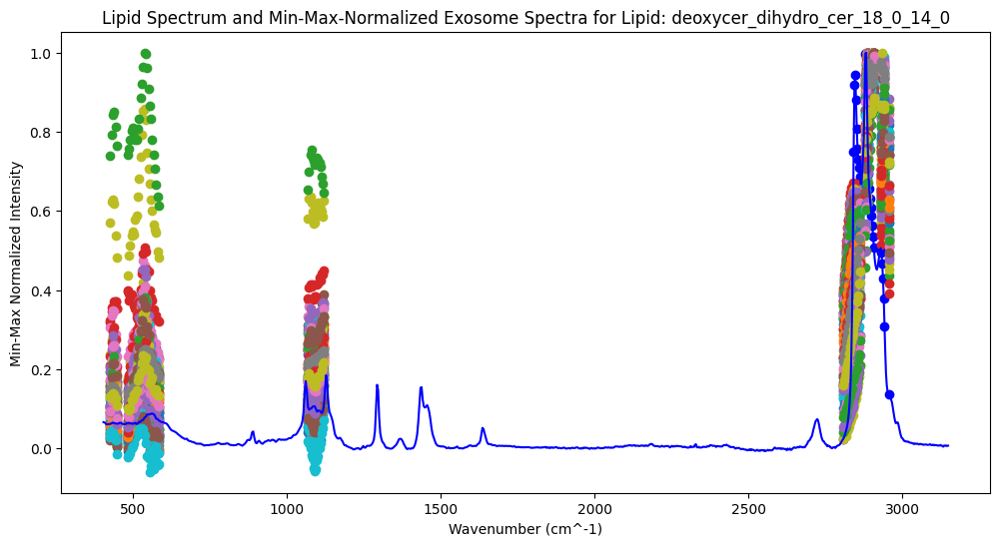

Average MSE for Lipid: deoxycer_dihydro_cer_18_0_14_0 is 0.06755910754506222

Ranked Average MSE Values for A375:
Lipid: Omega-3-25-5, Average MSE: 0.02999827893193895
Lipid: Cholesterol, Average MSE: 0.03658858620444341
Lipid: Cardiolipin, Average MSE: 0.04621547776292022
Lipid: Cholesterol Ester, Average MSE: 0.04635524864952557
Lipid: LaPI, Average MSE: 0.046706353048943064
Lipid: PE-18-1, Average MSE: 0.047321101966997826
Lipid: Phosphatidylcholine, Average MSE: 0.048045584666254616
Lipid: PC-18-1, Average MSE: 0.04872836101191024
Lipid: LDA, Average MSE: 0.04977480651685221
Lipid: PE, Average MSE: 0.05006822294699928
Lipid: PLS, Average MSE: 0.05214968942716931
Lipid: LaPG, Average MSE: 0.05383209180386142
Lipid: TAG, Average MSE: 0.05631482368394858
Lipid: Ceramide_18_1_12_0, Average MSE: 0.06531417361610016
Lipid: deoxycer_dihydro_cer_18_0_14_0, Average MSE: 0.06755910754506222
Lipid: C 24-1-cera3, Average MSE: 0.07742778435739414
Lipid: Sphingosine, Average MSE: 0.0790852440570

In [ ]:
#MSE for FEATURES (min-max intensities)

# CHOOSE SAMPLE EXOSOME
sample = 'A375'


def calculate_mse(intensities_exosome, intensities_lipid):
    return mean_squared_error(intensities_exosome, intensities_lipid)

# Load lipid and exosome data
lipid_file_path = '/content/drive/My Drive/cancer_exosome/MSE/InterpolatedLipids.csv'
exosome_file_path = '/content/drive/My Drive/cancer_exosome/Complete Baseline Corrected Spectra/' + sample + '.csv'

lipid_data = pd.read_csv(lipid_file_path)
exosome_data = pd.read_csv(exosome_file_path)

# Extract lipid wavenumbers and spectra
lipid_wavenumbers = lipid_data.iloc[:, 0].values
lipid_spectra = lipid_data.iloc[:, 1:]

norm_lipid_spectra = np.zeros(lipid_spectra.shape)
for j in range(lipid_spectra.shape[1]):
  temp = np.array(lipid_spectra)[:,j]
  max_index = np.argmax(temp)
  min_index = 444
  norm_temp = min_max_norm(temp, min_index, max_index)
  norm_lipid_spectra[:,j] = norm_temp


# Extract exosome spectra
exosome_wavelengths = exosome_data['Wavenumber'].values
exosome_spectra = exosome_data.iloc[:, 1:]
norm_spectra = np.zeros(exosome_spectra.shape)
for j in range(exosome_spectra.shape[1]):
  temp = np.array(exosome_spectra)[:,j]
  max_index = np.argmax(temp)
  min_index = 444
  norm_temp = min_max_norm(temp, min_index, max_index)
  norm_spectra[:,j] = norm_temp

# Dictionary to store average MSE for each lipid
average_mse_per_lipid = {}

# Process each lipid spectrum
for lipid_idx in range(len(lipid_spectra.columns)):
    lipid_feature_intensities = norm_lipid_spectra[top_indeces,lipid_idx]

    # Normalize lipid spectrum using SNV
    lipid = lipid_feature_intensities
    lipid_s = norm_lipid_spectra[:,lipid_idx]

    # Print lipid SNV spectrum for debugging
    plt.figure(figsize=(12, 6))
    plt.scatter(lipid_wavenumbers[top_indeces], lipid, label=f'Lipid: {lipid_spectra.columns[lipid_idx]}', color='blue')
    plt.plot(lipid_wavenumbers, lipid_s, label=f'Lipid: {lipid_spectra.columns[lipid_idx]}', color='blue')
    plt.title(f'Lipid Spectrum and Min-Max-Normalized Exosome Spectra for Lipid: {lipid_spectra.columns[lipid_idx]}')
    plt.xlabel('Wavenumber (cm^-1)')
    plt.ylabel('Min-Max Normalized Intensity')

    # Process each exosome spectrum
    mse_values = []
    for spectrum_idx in range(len(exosome_spectra.columns)):
        exosome_feature_intensities = norm_spectra[top_indeces,spectrum_idx]
        # Normalize exosome spectrum using SNV
        exosome = exosome_feature_intensities

        # Calculate and store MSE
        mse = calculate_mse(exosome, lipid)
        mse_values.append(mse)

        # Plot the SNV normalized exosome spectrum
        plt.scatter(exosome_wavelengths[top_indeces], exosome, label=f'Exosome: {exosome_spectra.columns[spectrum_idx]}')
    plt.show()

    # Compute and store average MSE for this lipid
    average_mse = np.mean(mse_values)
    average_mse_per_lipid[lipid_spectra.columns[lipid_idx]] = average_mse
    print(f'Average MSE for Lipid: {lipid_spectra.columns[lipid_idx]} is {average_mse}')

# Rank and display average MSE values
sorted_average_mse = sorted(average_mse_per_lipid.items(), key=lambda item: item[1])

print("\nRanked Average MSE Values for " + sample+ ":")
for lipid, avg_mse in sorted_average_mse:
    print(f'Lipid: {lipid}, Average MSE: {avg_mse}')

# Save the MSE results to a CSV file
mse_results_df = pd.DataFrame(sorted_average_mse)
mse_results_df.to_csv('/content/drive/My Drive/cancer_exosome/Complete Baseline Corrected Spectra/' + sample + '-MSE_results.csv', index=False)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


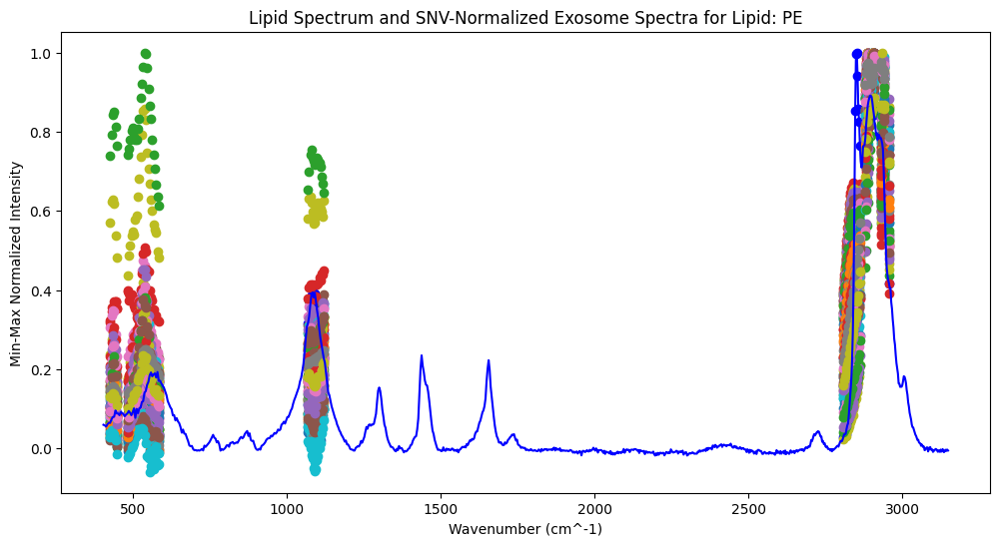

Average Cosine Similarity Score for Lipid: PE is 0.8995511905874128


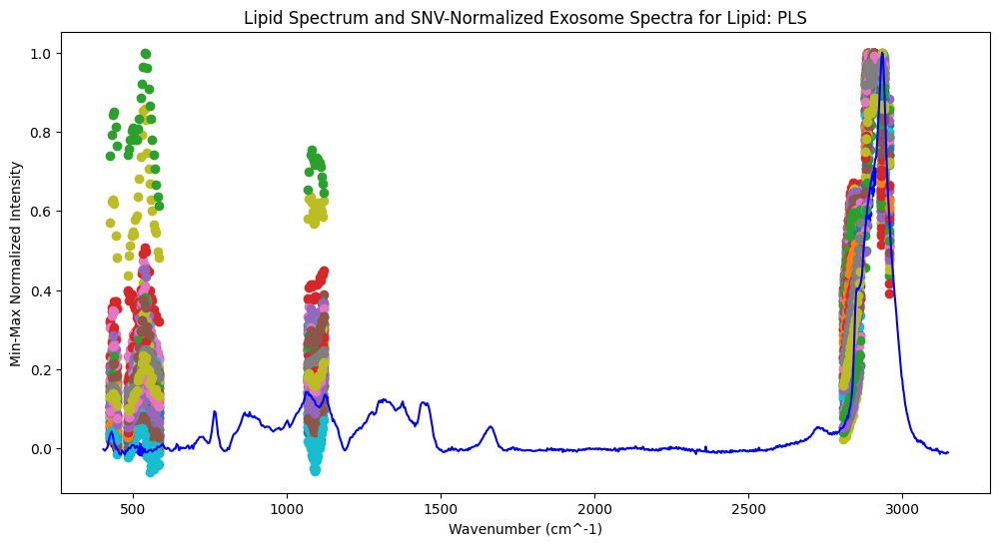

Average Cosine Similarity Score for Lipid: PLS is 0.8956854772133259


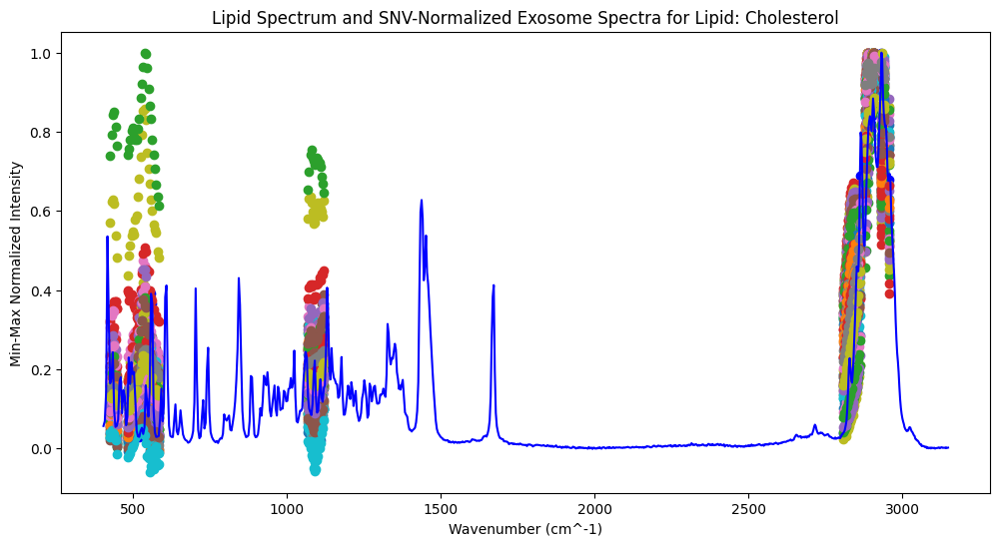

Average Cosine Similarity Score for Lipid: Cholesterol is 0.9255383804232664


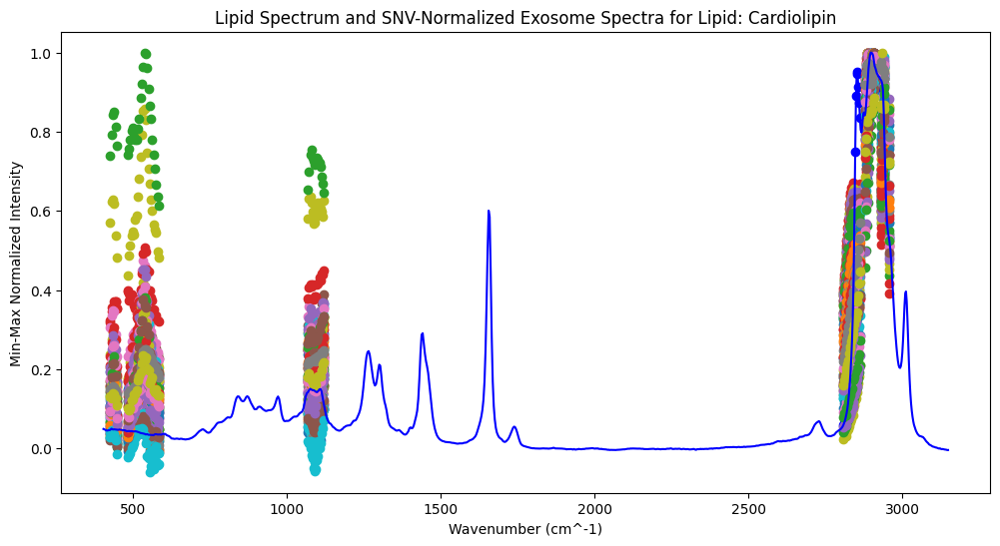

Average Cosine Similarity Score for Lipid: Cardiolipin is 0.9139747145288369


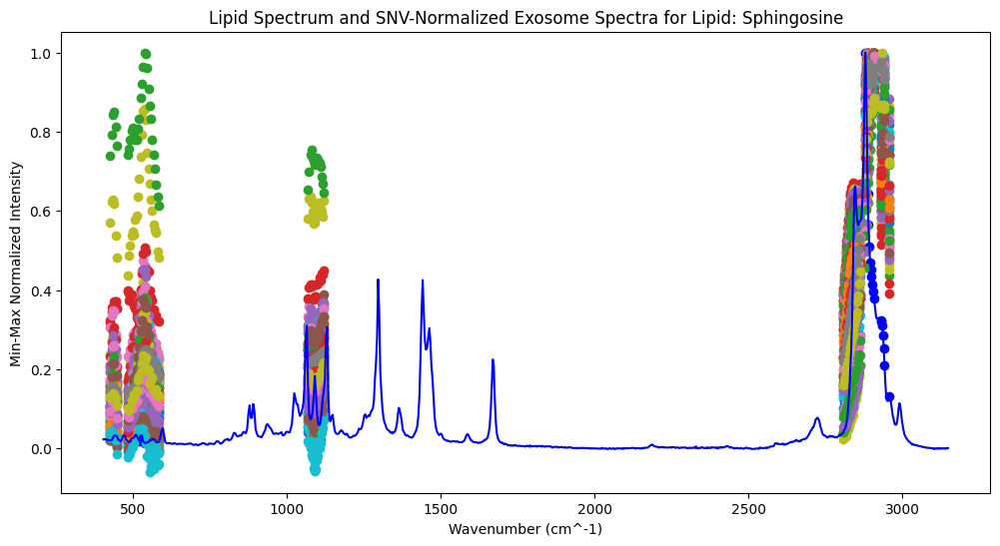

Average Cosine Similarity Score for Lipid: Sphingosine is 0.8370270942645619


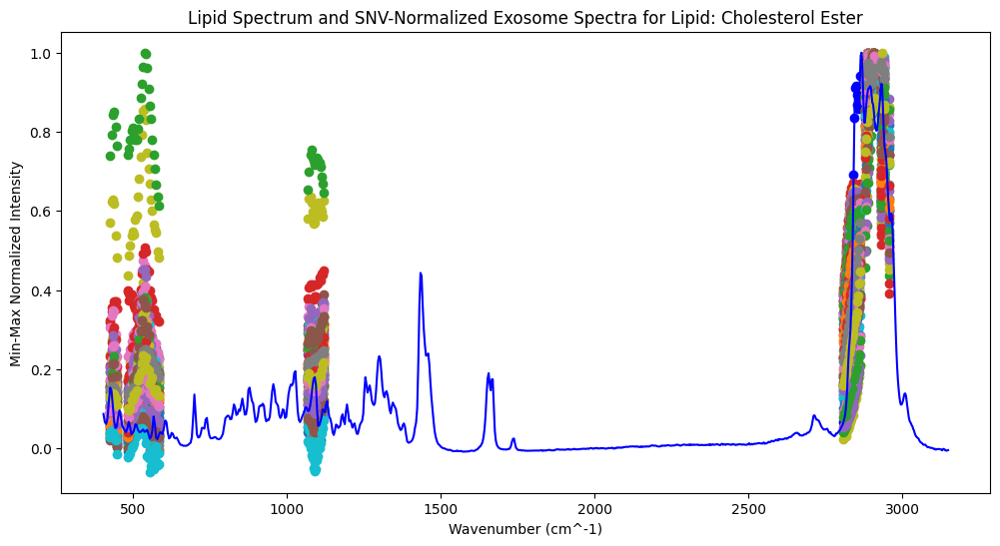

Average Cosine Similarity Score for Lipid: Cholesterol Ester is 0.9122955108231321


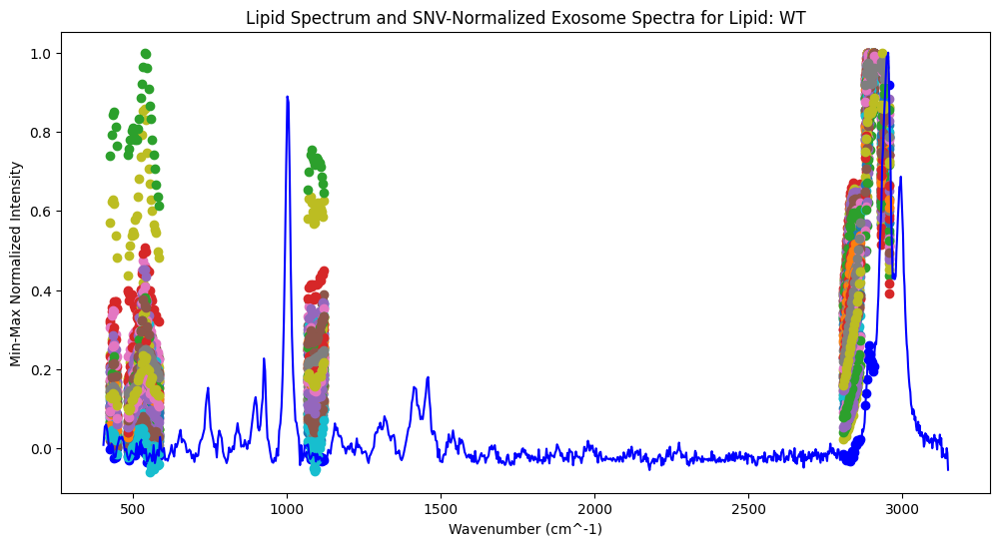

Average Cosine Similarity Score for Lipid: WT is 0.628548928902848


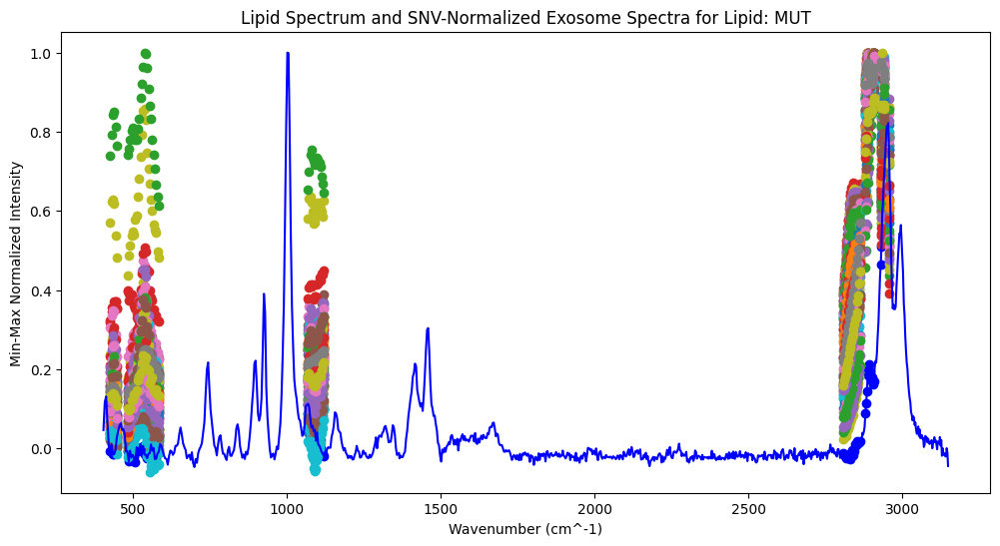

Average Cosine Similarity Score for Lipid: MUT is 0.6409329521986197


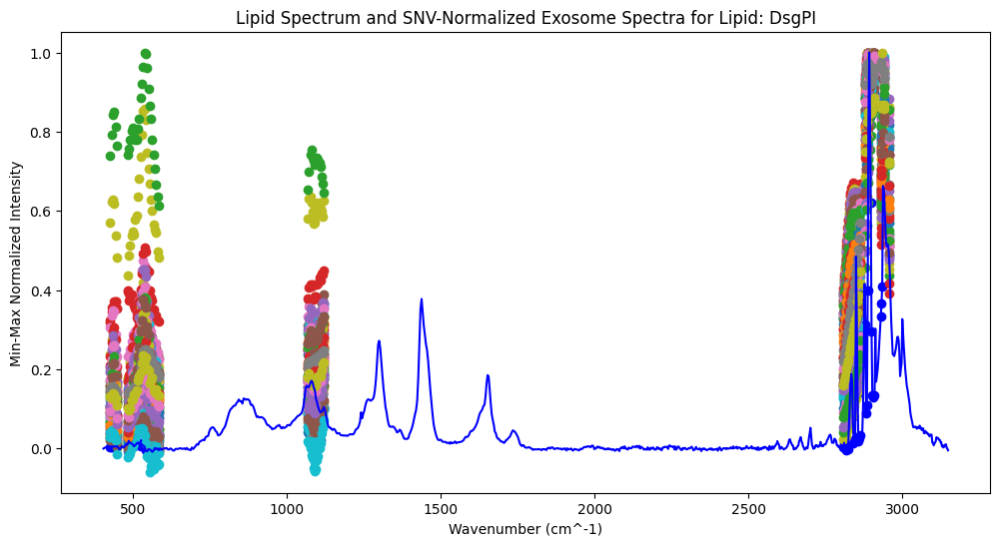

Average Cosine Similarity Score for Lipid: DsgPI is 0.7681774318589573


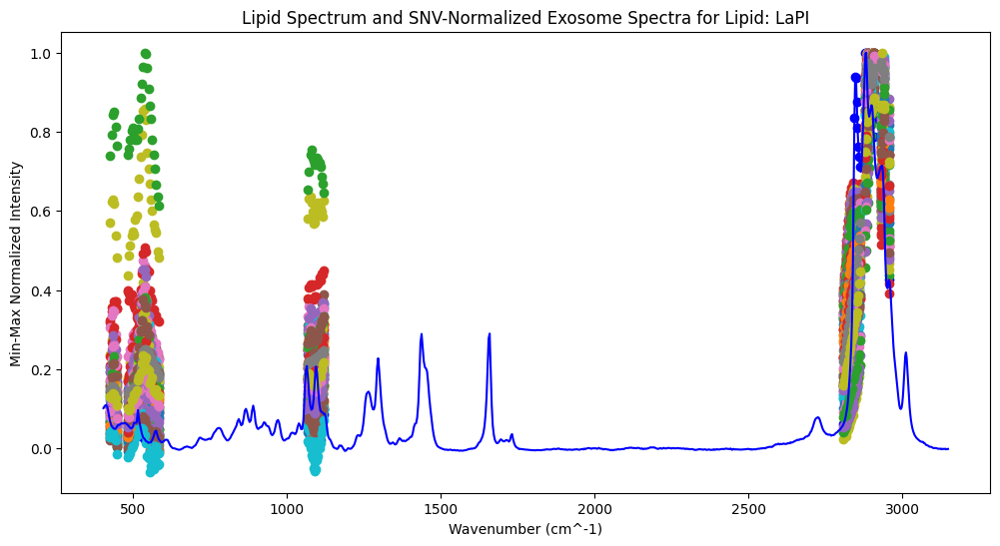

Average Cosine Similarity Score for Lipid: LaPI is 0.9033525451579648


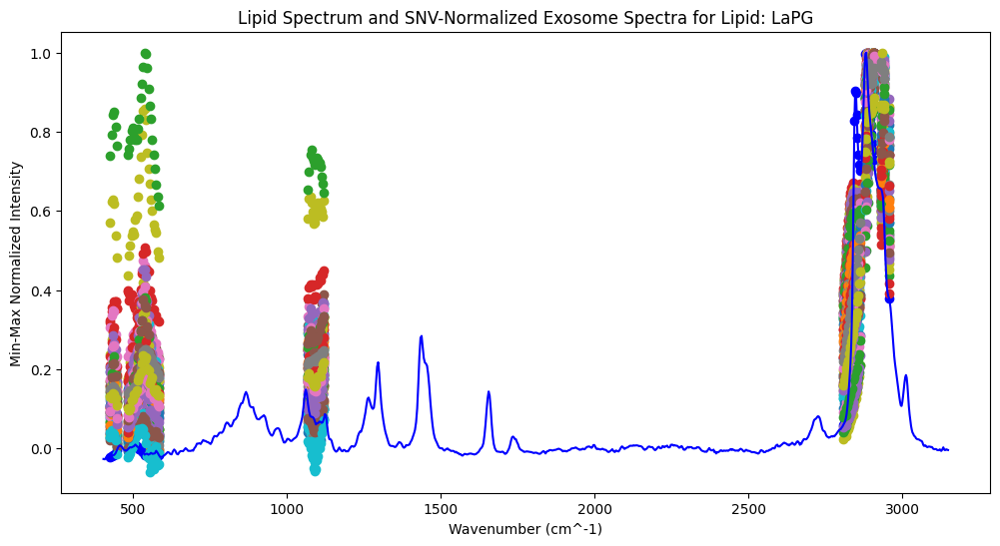

Average Cosine Similarity Score for Lipid: LaPG is 0.8855932425240057


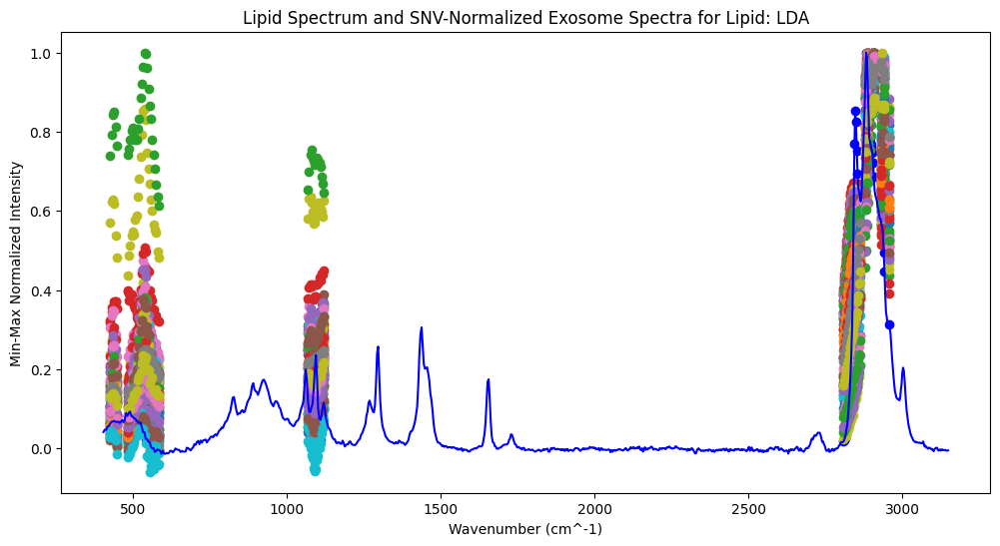

Average Cosine Similarity Score for Lipid: LDA is 0.8933288282965524


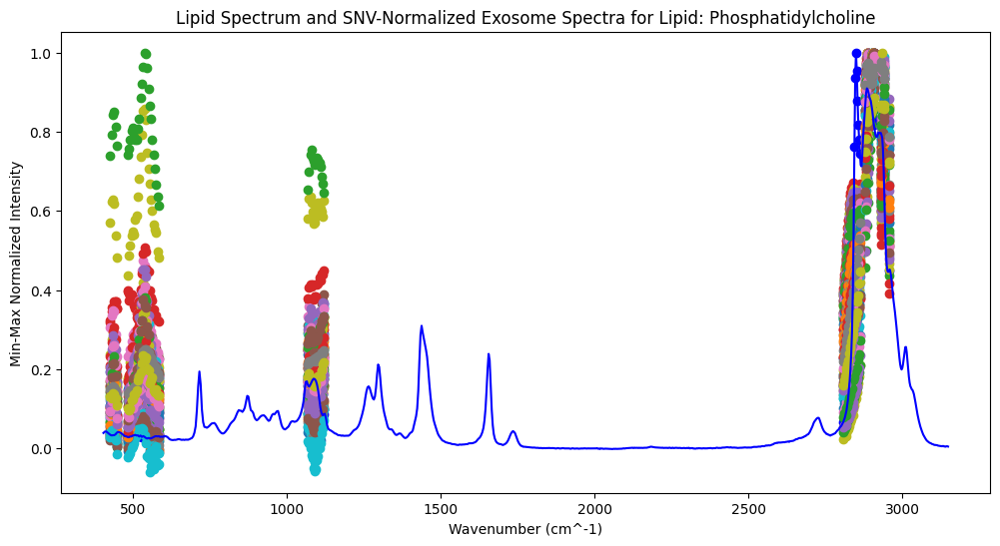

Average Cosine Similarity Score for Lipid: Phosphatidylcholine is 0.9020864811946849


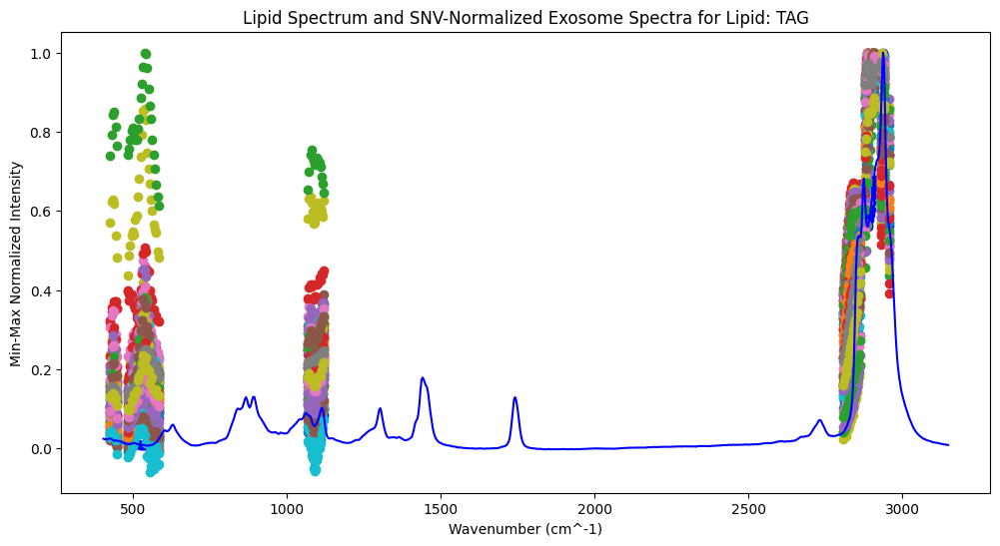

Average Cosine Similarity Score for Lipid: TAG is 0.8867491998609733


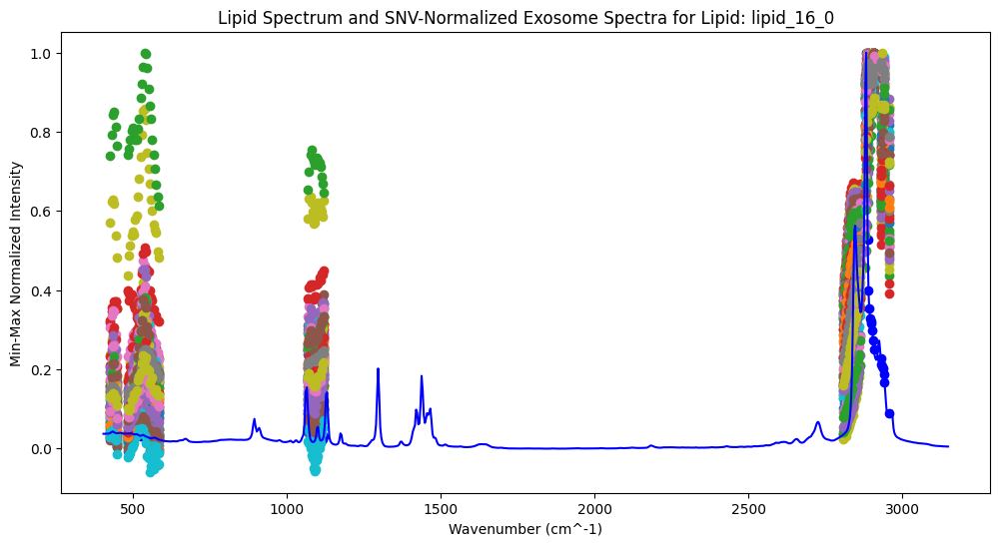

Average Cosine Similarity Score for Lipid: lipid_16_0 is 0.7906117899393738


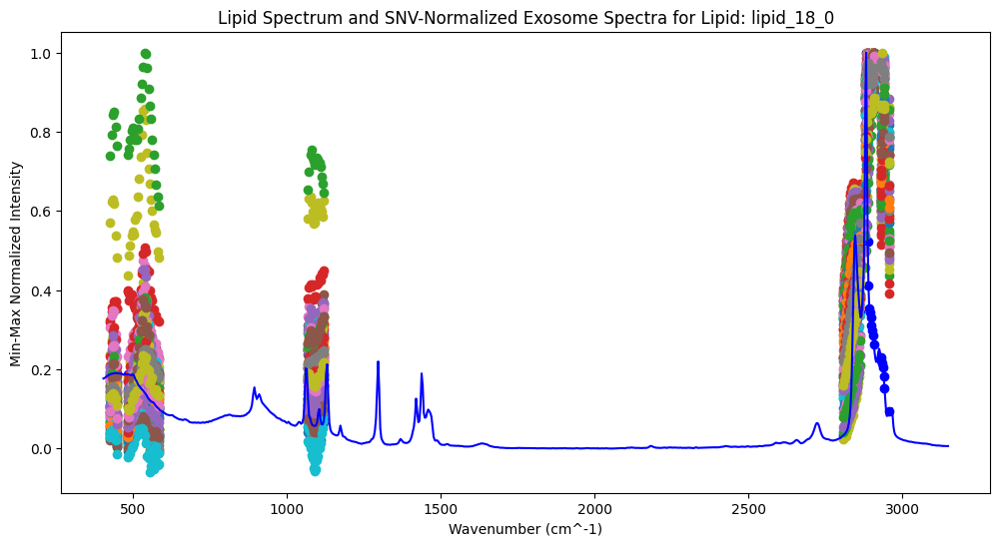

Average Cosine Similarity Score for Lipid: lipid_18_0 is 0.8099393171466109


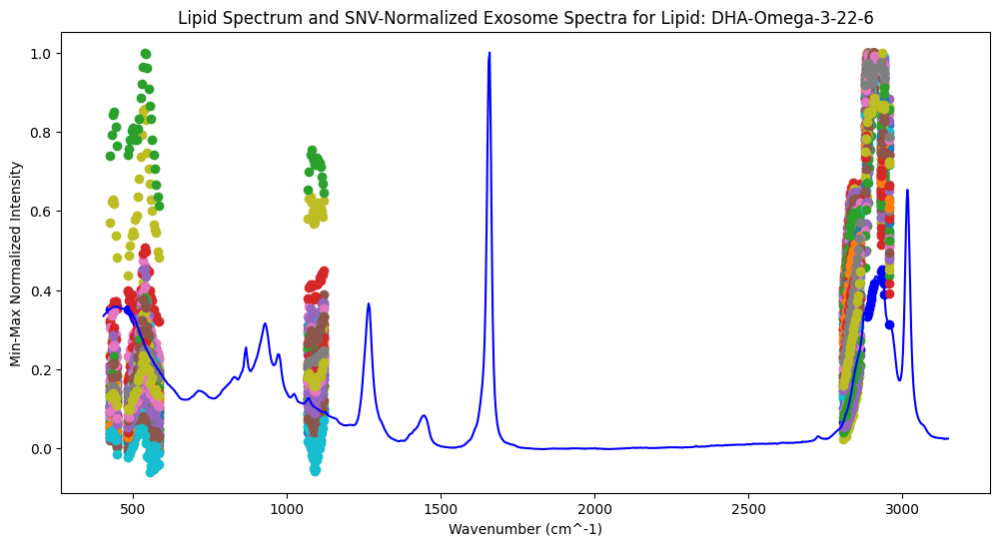

Average Cosine Similarity Score for Lipid: DHA-Omega-3-22-6 is 0.8277707544372981


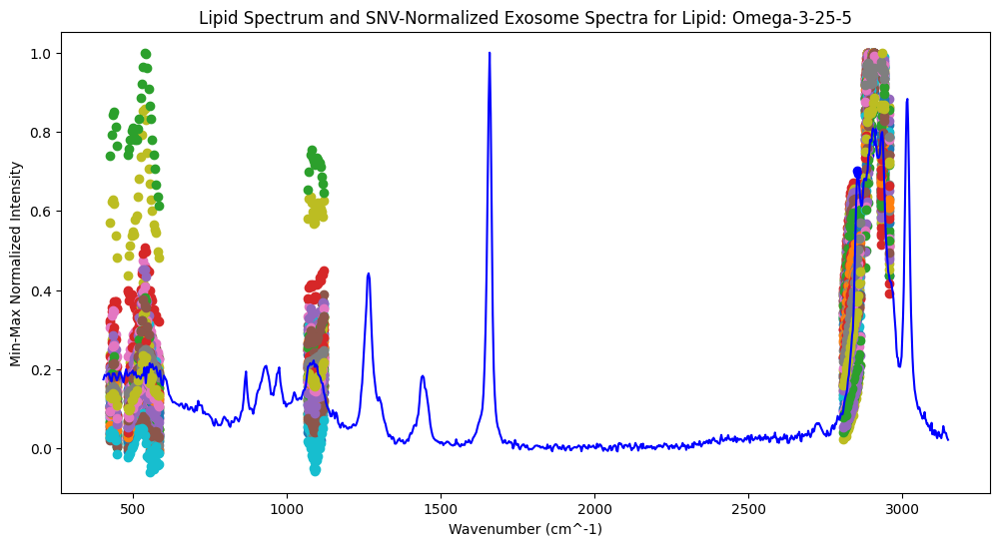

Average Cosine Similarity Score for Lipid: Omega-3-25-5 is 0.9405344746978944


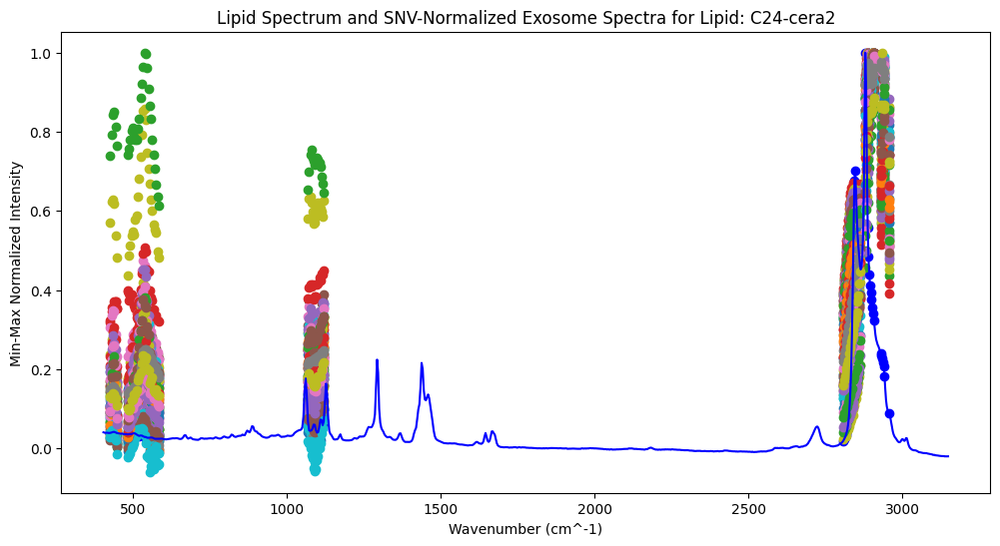

Average Cosine Similarity Score for Lipid: C24-cera2 is 0.8016925705320825


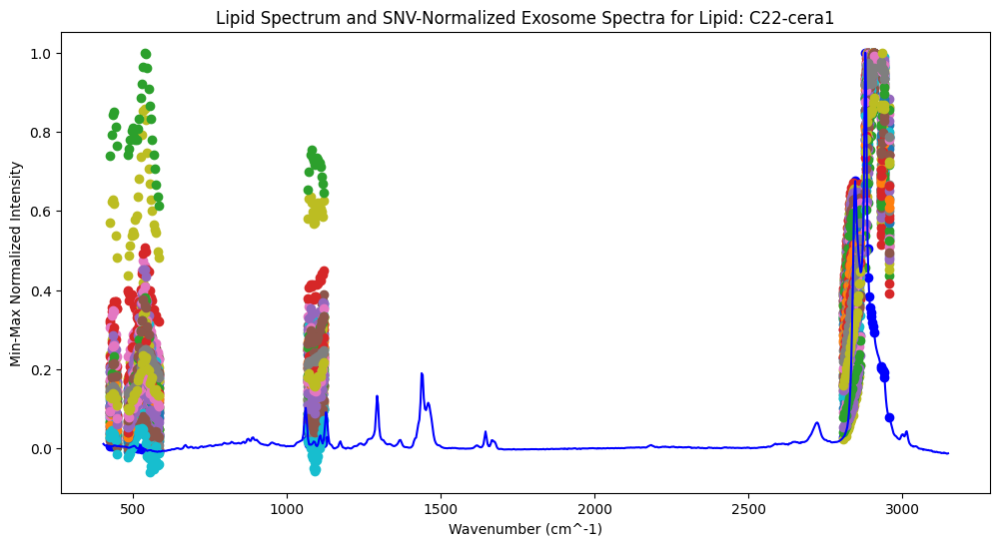

Average Cosine Similarity Score for Lipid: C22-cera1 is 0.770018611231857


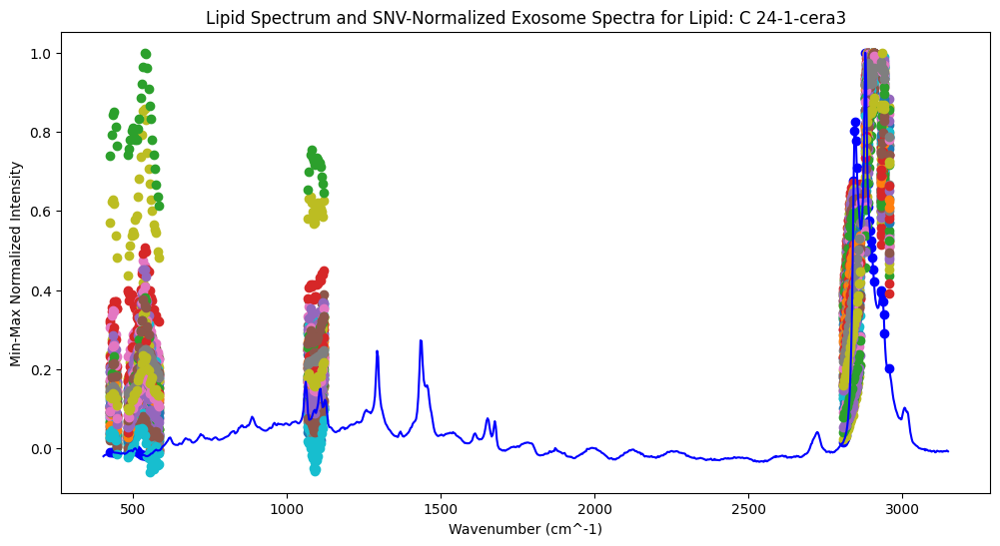

Average Cosine Similarity Score for Lipid: C 24-1-cera3 is 0.8289842660412455


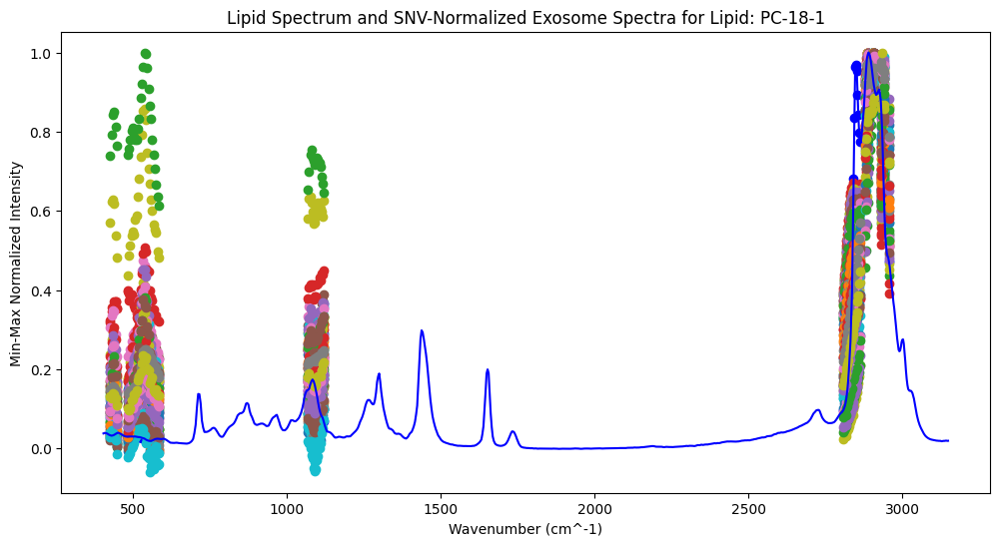

Average Cosine Similarity Score for Lipid: PC-18-1 is 0.908728542787551


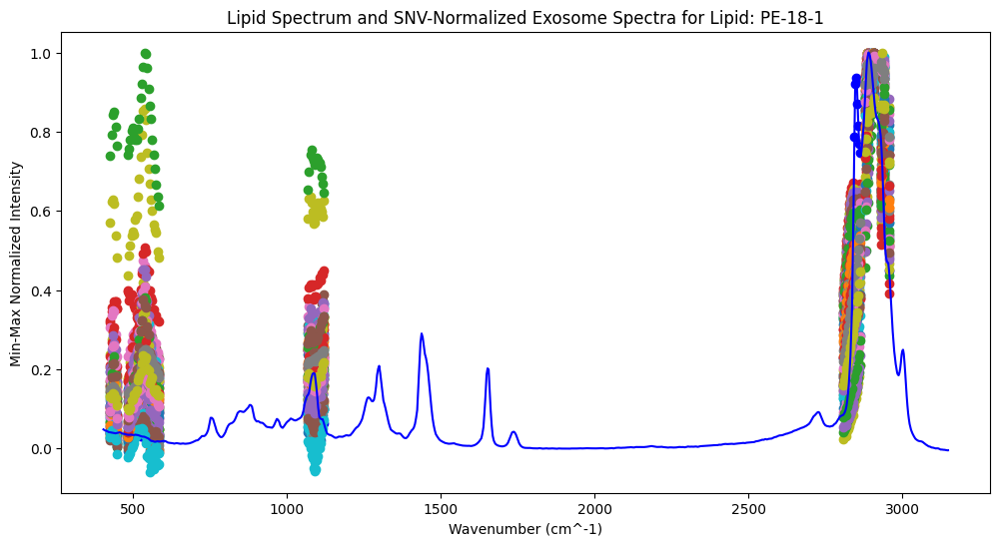

Average Cosine Similarity Score for Lipid: PE-18-1 is 0.9069056690571214


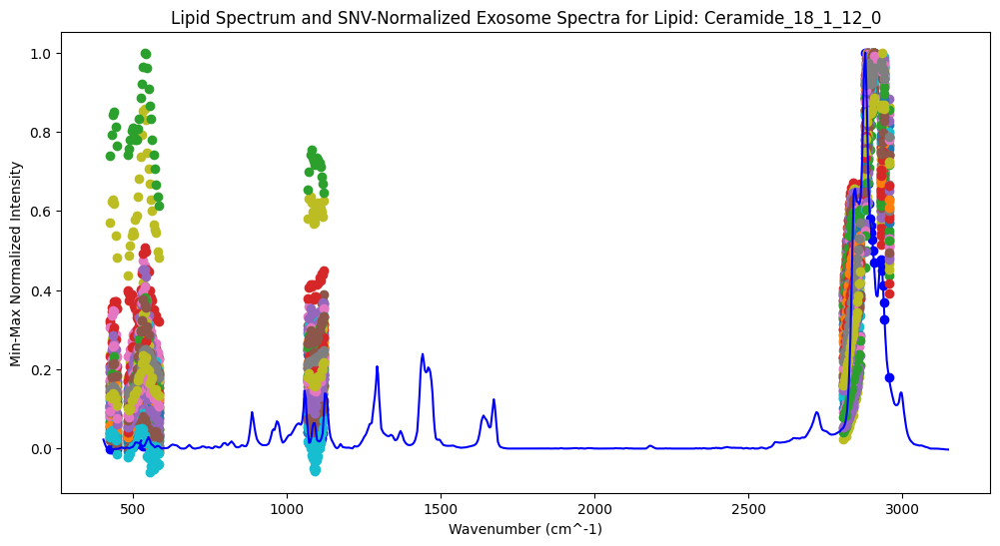

Average Cosine Similarity Score for Lipid: Ceramide_18_1_12_0 is 0.8627680196070796


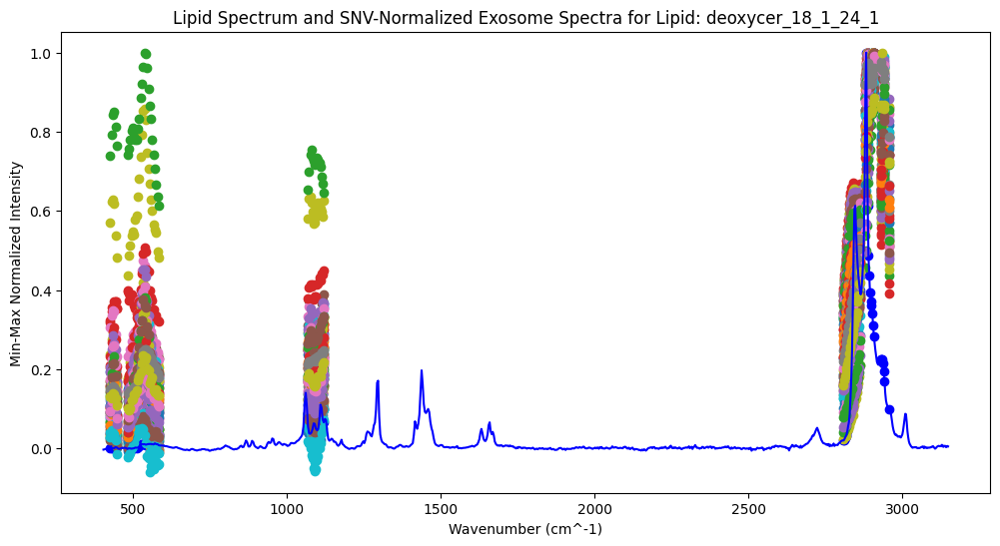

Average Cosine Similarity Score for Lipid: deoxycer_18_1_24_1 is 0.7992164414442322


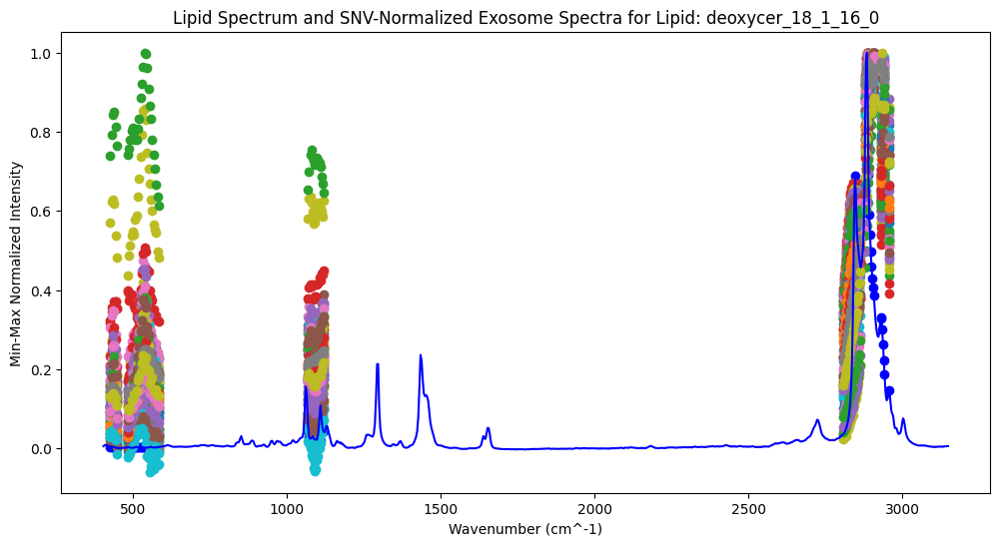

Average Cosine Similarity Score for Lipid: deoxycer_18_1_16_0 is 0.827170051479787


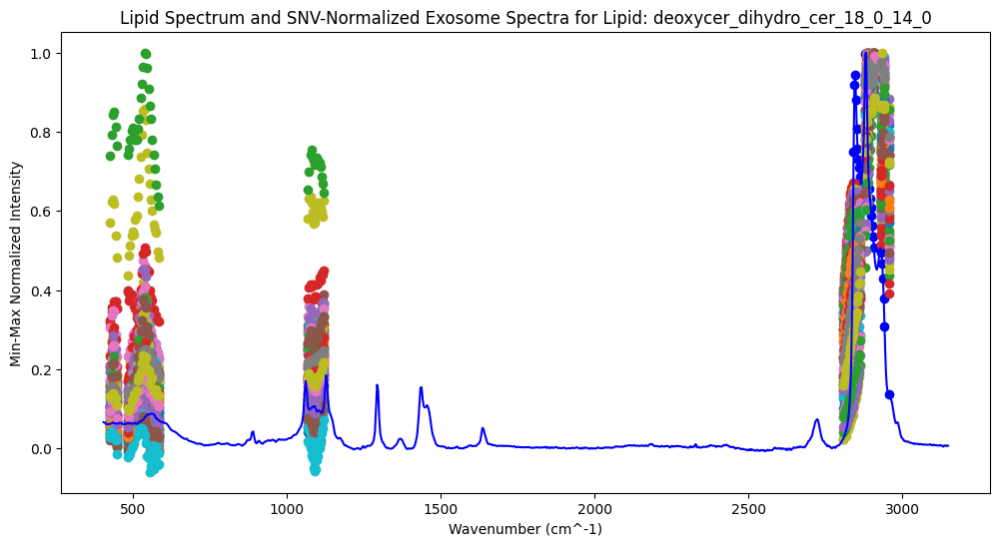

Average Cosine Similarity Score for Lipid: deoxycer_dihydro_cer_18_0_14_0 is 0.8488738213852871

Ranked Average Cosine Similarity Values:
Lipid: Omega-3-25-5, Average Cosine Similarity: 0.9405344746978944
Lipid: Cholesterol, Average Cosine Similarity: 0.9255383804232664
Lipid: Cardiolipin, Average Cosine Similarity: 0.9139747145288369
Lipid: Cholesterol Ester, Average Cosine Similarity: 0.9122955108231321
Lipid: PC-18-1, Average Cosine Similarity: 0.908728542787551
Lipid: PE-18-1, Average Cosine Similarity: 0.9069056690571214
Lipid: LaPI, Average Cosine Similarity: 0.9033525451579648
Lipid: Phosphatidylcholine, Average Cosine Similarity: 0.9020864811946849
Lipid: PE, Average Cosine Similarity: 0.8995511905874128
Lipid: PLS, Average Cosine Similarity: 0.8956854772133259
Lipid: LDA, Average Cosine Similarity: 0.8933288282965524
Lipid: TAG, Average Cosine Similarity: 0.8867491998609733
Lipid: LaPG, Average Cosine Similarity: 0.8855932425240057
Lipid: Ceramide_18_1_12_0, Average Cosine Sim

In [ ]:
#Cosine Similarity for Features

# CHOOSE SAMPLE EXOSOME
sample = 'A375'

# Mount Google Drive
drive.mount('/content/drive')

def compute_cosine_similarity(spectrum1, spectrum2):
    return cosine_similarity([spectrum1], [spectrum2])[0, 0]

# Load lipid and exosome data
lipid_file_path = '/content/drive/My Drive/cancer_exosome/MSE/InterpolatedLipids.csv'
exosome_file_path = '/content/drive/My Drive/cancer_exosome/Complete Baseline Corrected Spectra/' + sample +'.csv'

lipid_data = pd.read_csv(lipid_file_path)
exosome_data = pd.read_csv(exosome_file_path)

# Extract lipid wavenumbers and spectra
lipid_wavenumbers = lipid_data.iloc[:, 0].values
lipid_spectra = lipid_data.iloc[:, 1:]

norm_lipid_spectra = np.zeros(lipid_spectra.shape)
for j in range(lipid_spectra.shape[1]):
  temp = np.array(lipid_spectra)[:,j]
  max_index = np.argmax(temp)
  min_index = 444
  norm_temp = min_max_norm(temp, min_index, max_index)
  norm_lipid_spectra[:,j] = norm_temp


# Extract exosome spectra
exosome_wavelengths = exosome_data['Wavenumber'].values
exosome_spectra = exosome_data.iloc[:, 1:]
norm_spectra = np.zeros(exosome_spectra.shape)
for j in range(exosome_spectra.shape[1]):
  temp = np.array(exosome_spectra)[:,j]
  max_index = np.argmax(temp)
  min_index = 444
  norm_temp = min_max_norm(temp, min_index, max_index)
  norm_spectra[:,j] = norm_temp

# Dictionary to store average cosine similarity for each lipid
average_similarity_per_lipid = {}

# Process each lipid spectrum
for lipid_idx in range(len(lipid_spectra.columns)):
    lipid_feature_intensities = norm_lipid_spectra[top_indeces,lipid_idx]

    lipid = lipid_feature_intensities
    lipid_s = norm_lipid_spectra[:,lipid_idx]

    # Print lipid SNV spectrum for debugging
    plt.figure(figsize=(12, 6))
    plt.scatter(lipid_wavenumbers[top_indeces], lipid, label=f'Lipid: {lipid_spectra.columns[lipid_idx]}', color='blue')
    plt.plot(lipid_wavenumbers, lipid_s, label=f'Lipid: {lipid_spectra.columns[lipid_idx]}', color='blue')
    plt.title(f'Lipid Spectrum and SNV-Normalized Exosome Spectra for Lipid: {lipid_spectra.columns[lipid_idx]}')
    plt.xlabel('Wavenumber (cm^-1)')
    plt.ylabel('Min-Max Normalized Intensity')

    # Process each exosome spectrum
    similarities = []
    for spectrum_idx in range(len(exosome_spectra.columns)):
        exosome_feature_intensities = norm_spectra[top_indeces,spectrum_idx]

        # Normalize exosome spectrum using SNV
        exosome = exosome_feature_intensities

        # Compute Cosine Similarity
        similarity = compute_cosine_similarity(lipid, exosome)
        similarities.append(similarity)


        # Plot the SNV normalized exosome spectrum
        plt.scatter(exosome_wavelengths[top_indeces], exosome, label=f'Exosome: {exosome_spectra.columns[spectrum_idx]}')

    plt.show()


    # Compute and store average Cosine Similarity for this lipid
    average_similarity = np.mean(similarities)
    average_similarity_per_lipid[lipid_spectra.columns[lipid_idx]] = average_similarity
    print(f'Average Cosine Similarity Score for Lipid: {lipid_spectra.columns[lipid_idx]} is {average_similarity}')


# Rank and display average Cosine Similarity values
sorted_average_similarity = sorted(average_similarity_per_lipid.items(), key=lambda item: item[1], reverse=True)

print("\nRanked Average Cosine Similarity Values:")
for lipid, avg_similarity in sorted_average_similarity:
    print(f'Lipid: {lipid}, Average Cosine Similarity: {avg_similarity}')

# Save the cosine similarities results to a CSV file
similarity_results_df = pd.DataFrame(sorted_average_similarity)
similarity_results_df.to_csv('/content/drive/My Drive/cancer_exosome/Complete Baseline Corrected Spectra/' + sample + '-cosine_similarity_results.csv', index=False)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


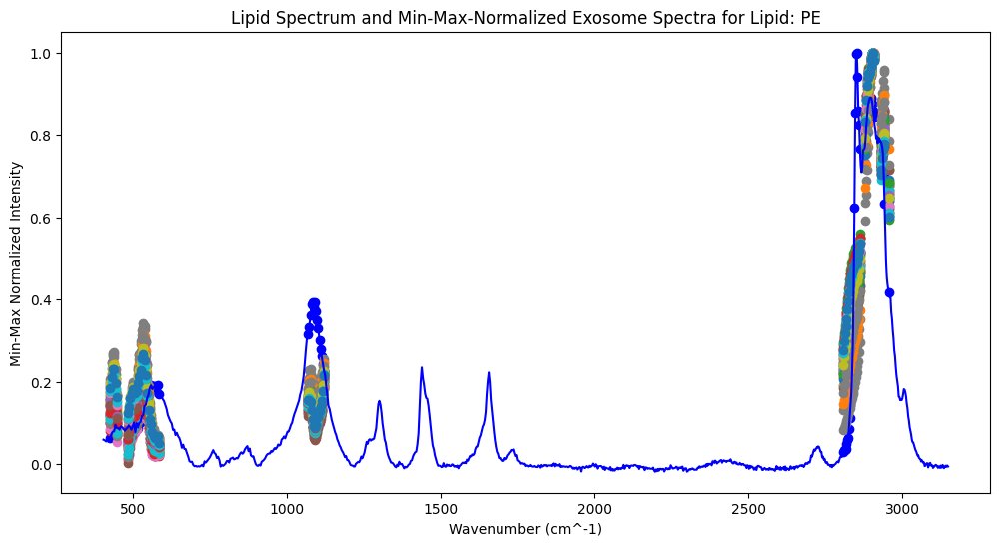

Average Cross-Correlation Score for Lipid: PE is 0.9161059474674237


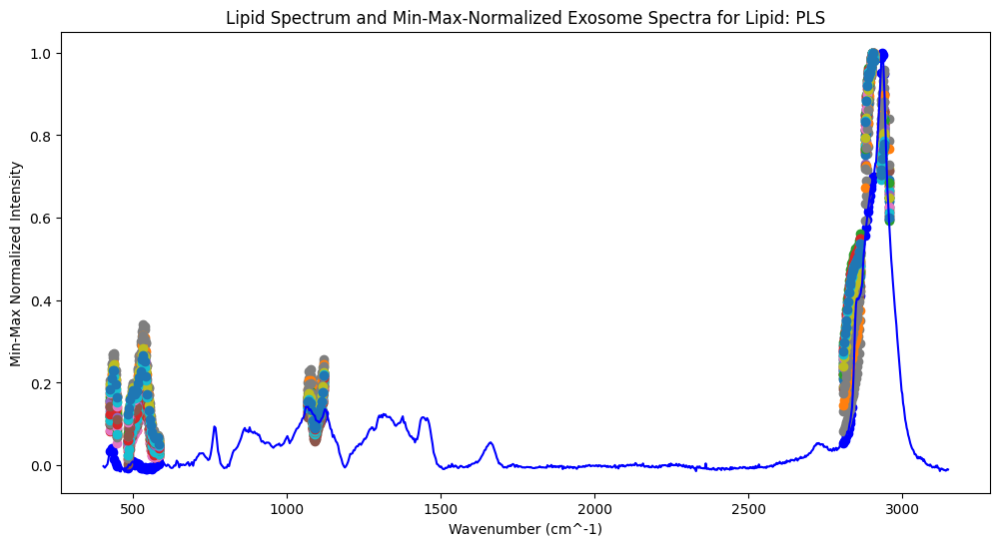

Average Cross-Correlation Score for Lipid: PLS is 0.9306286760629118


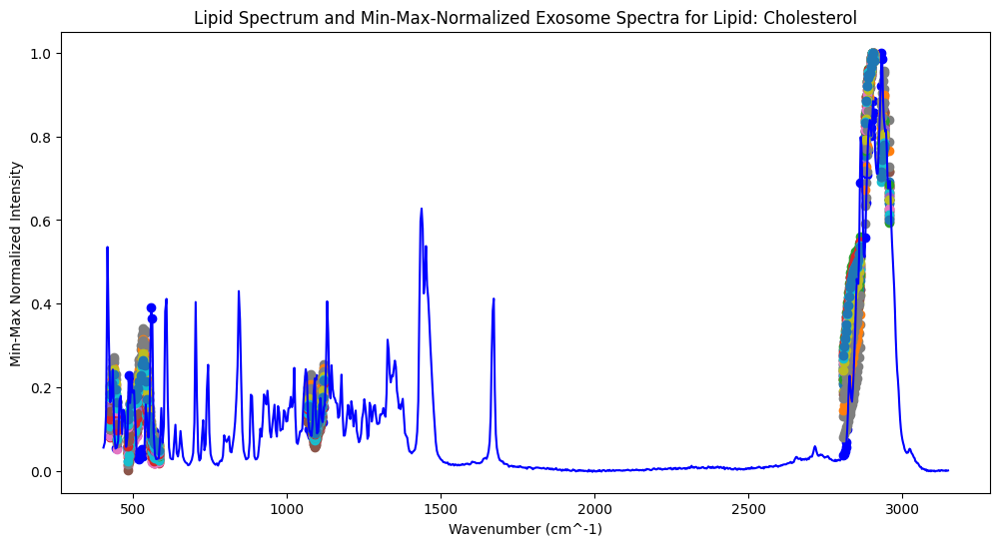

Average Cross-Correlation Score for Lipid: Cholesterol is 0.9547911380871748


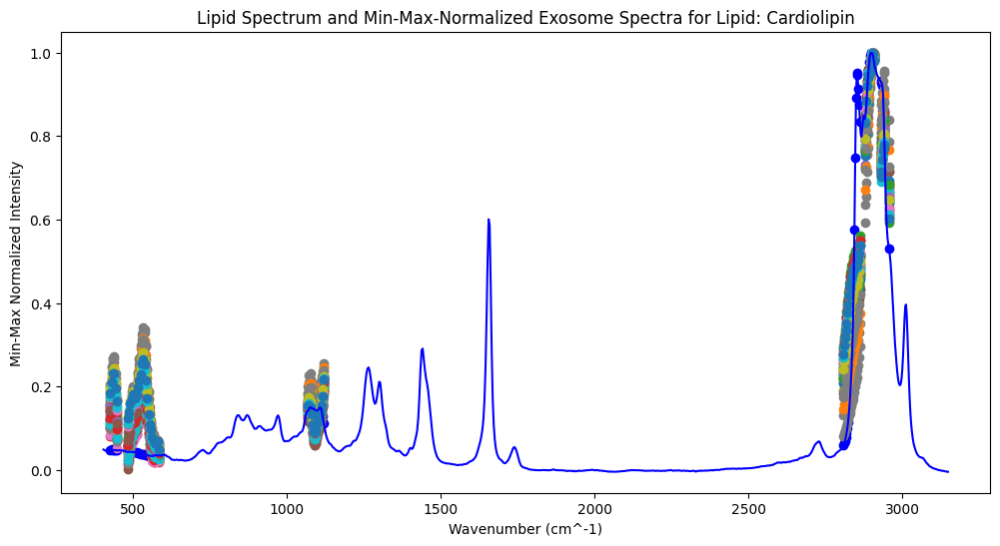

Average Cross-Correlation Score for Lipid: Cardiolipin is 0.9439587756210968


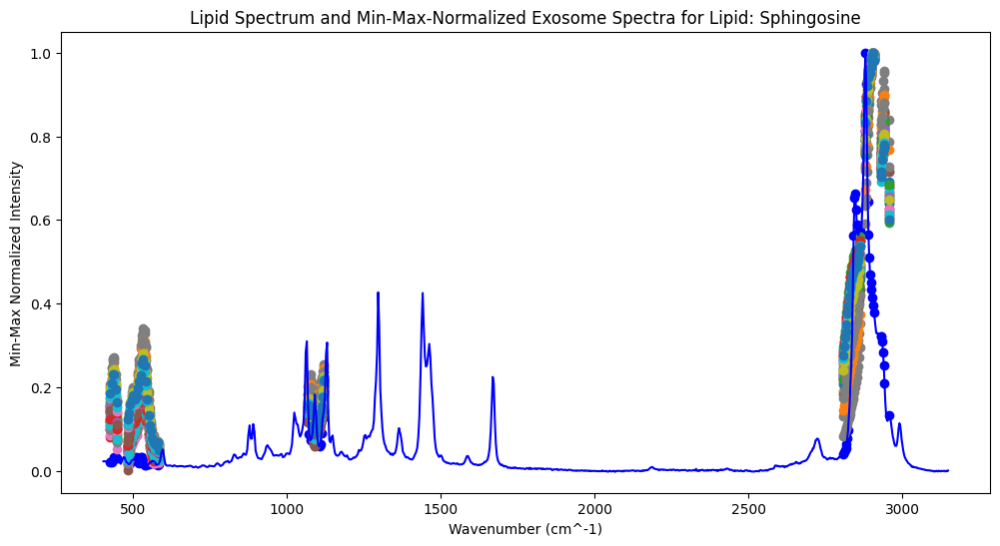

Average Cross-Correlation Score for Lipid: Sphingosine is 0.8554661688891952


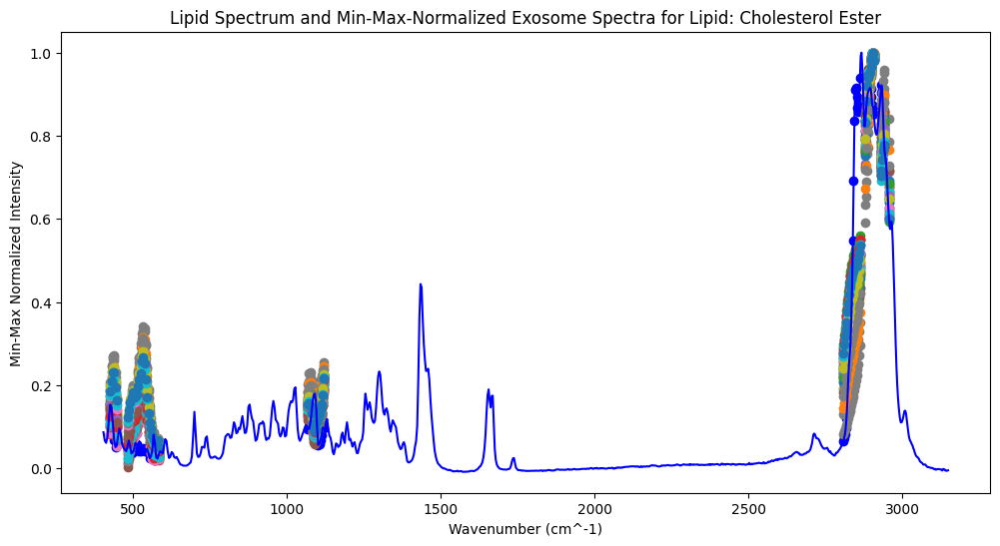

Average Cross-Correlation Score for Lipid: Cholesterol Ester is 0.9405847931418088


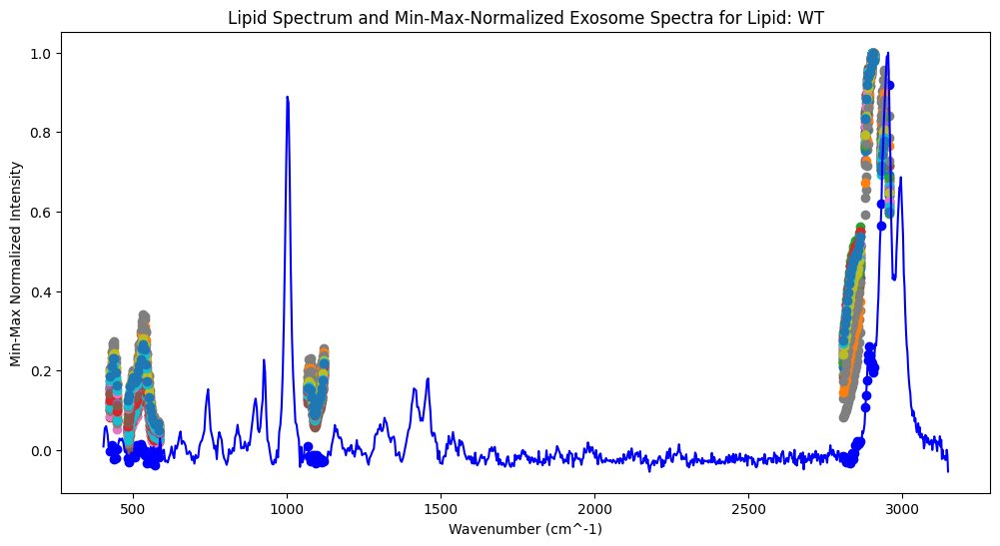

Average Cross-Correlation Score for Lipid: WT is 0.6675147862581882


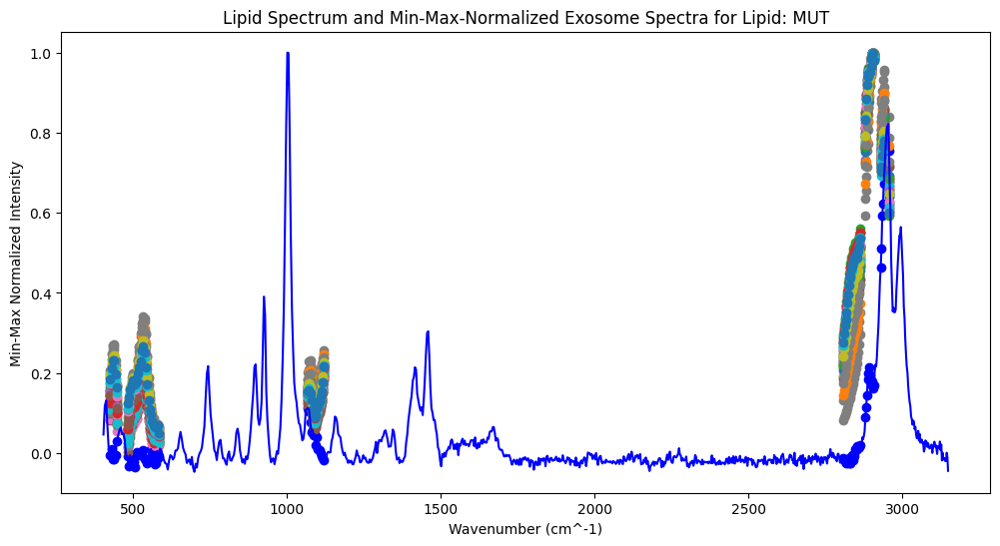

Average Cross-Correlation Score for Lipid: MUT is 0.6758722156572659


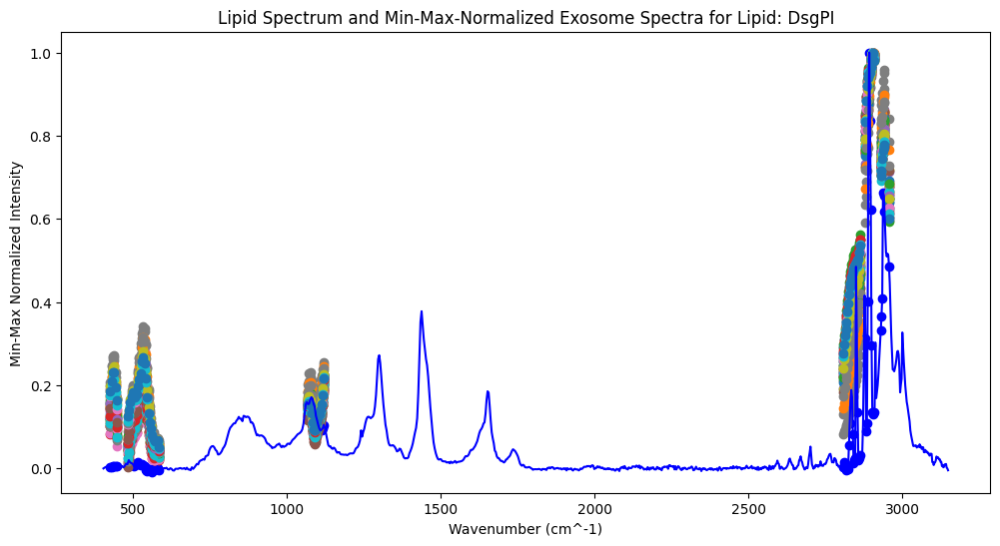

Average Cross-Correlation Score for Lipid: DsgPI is 0.7965300452137245


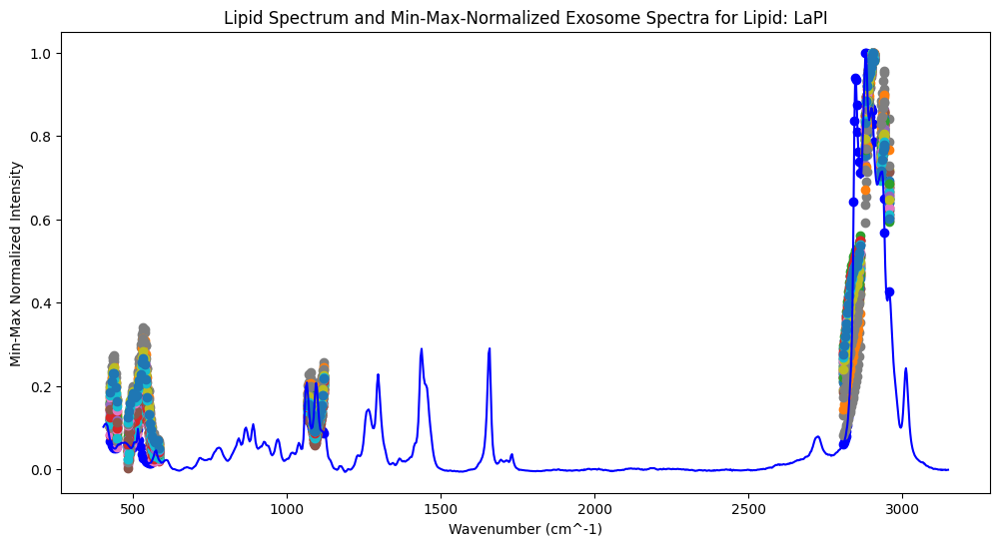

Average Cross-Correlation Score for Lipid: LaPI is 0.9300663158665317


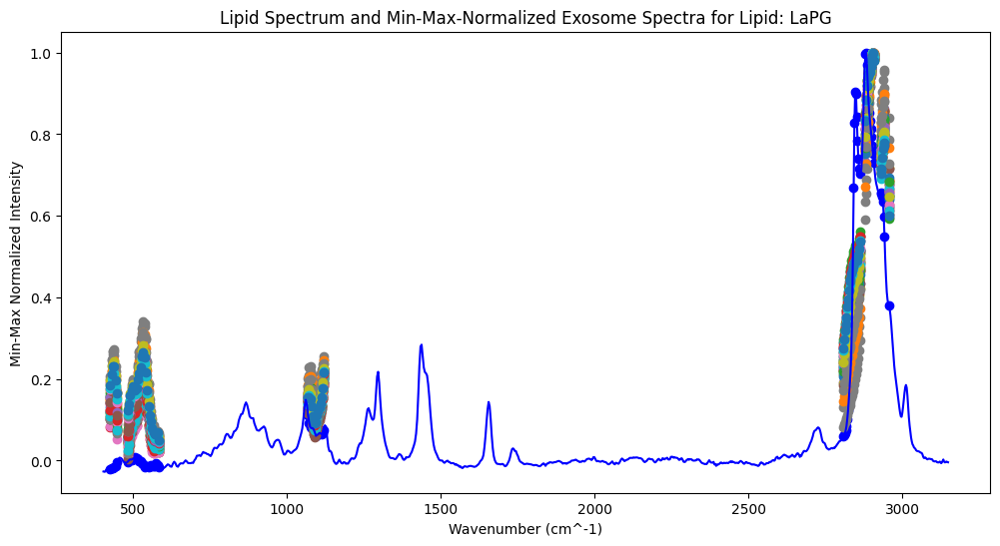

Average Cross-Correlation Score for Lipid: LaPG is 0.9144971280998645


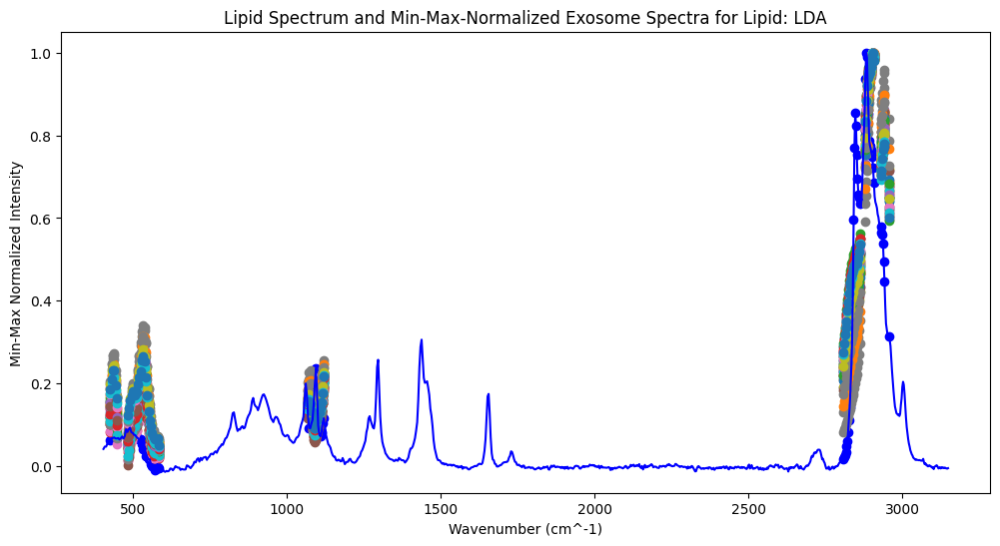

Average Cross-Correlation Score for Lipid: LDA is 0.919896788610098


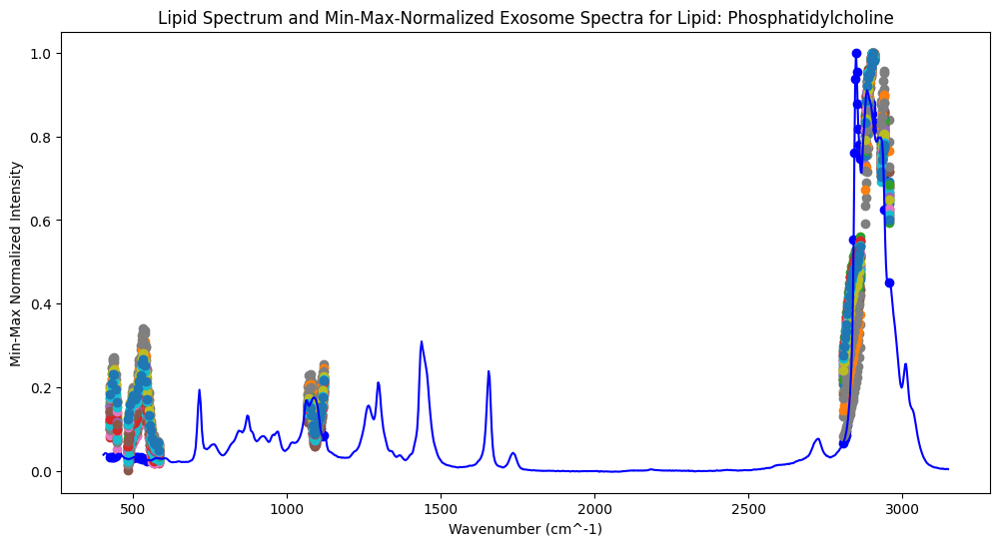

Average Cross-Correlation Score for Lipid: Phosphatidylcholine is 0.9292389188778067


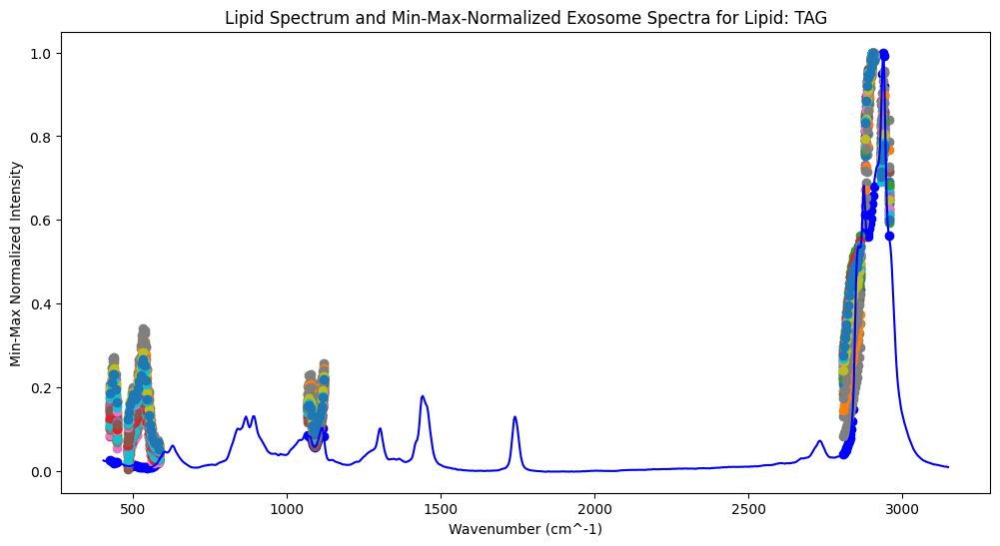

Average Cross-Correlation Score for Lipid: TAG is 0.9212748601553559


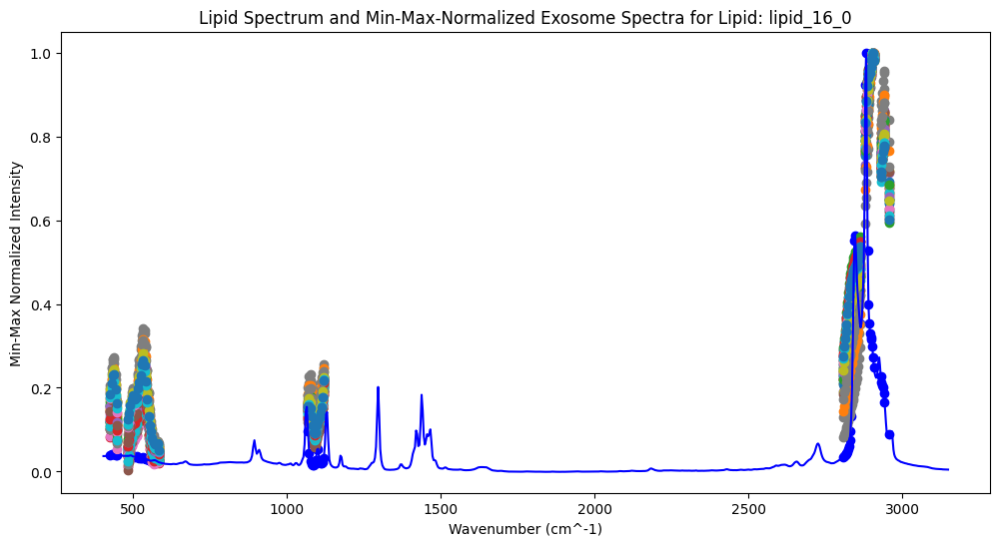

Average Cross-Correlation Score for Lipid: lipid_16_0 is 0.8096330131385122


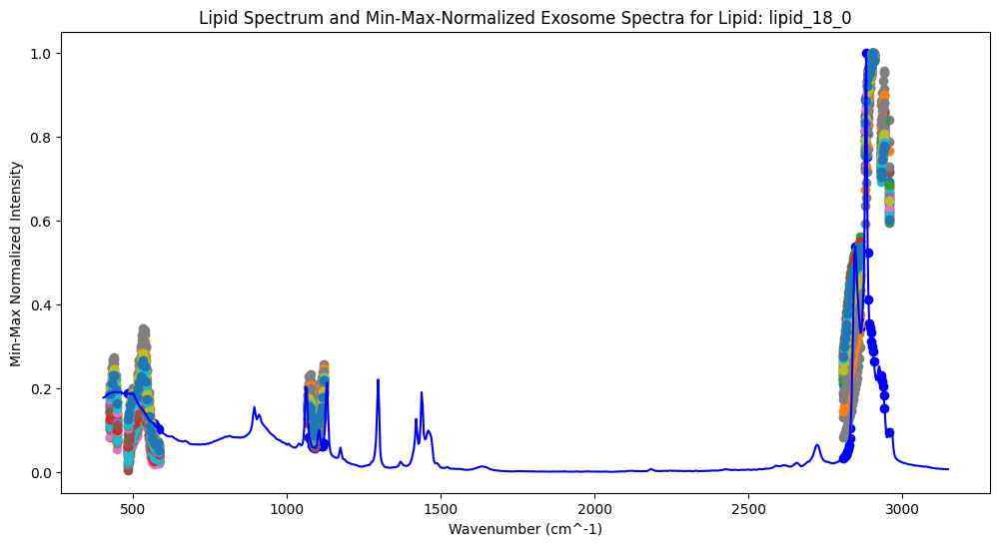

Average Cross-Correlation Score for Lipid: lipid_18_0 is 0.8220607439292826


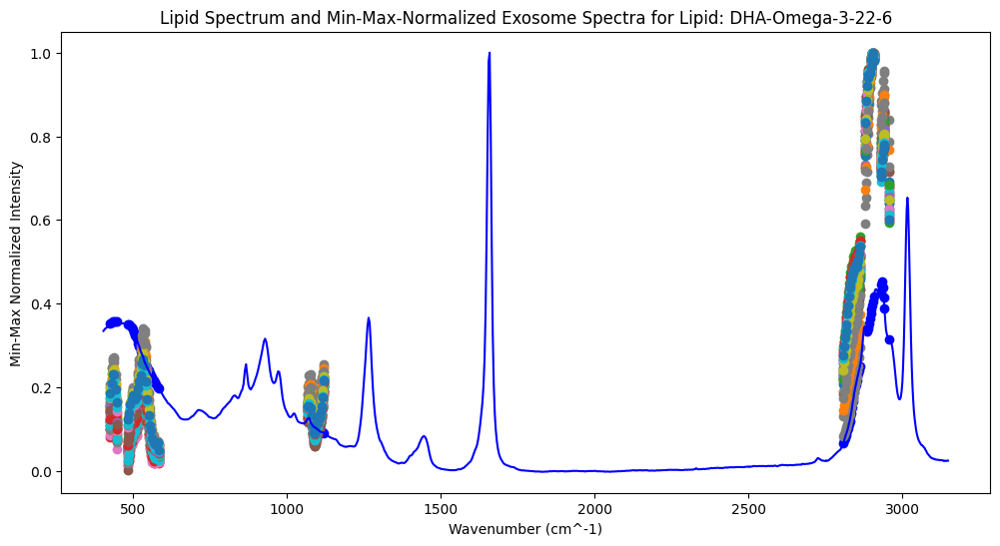

Average Cross-Correlation Score for Lipid: DHA-Omega-3-22-6 is 0.8393159465089332


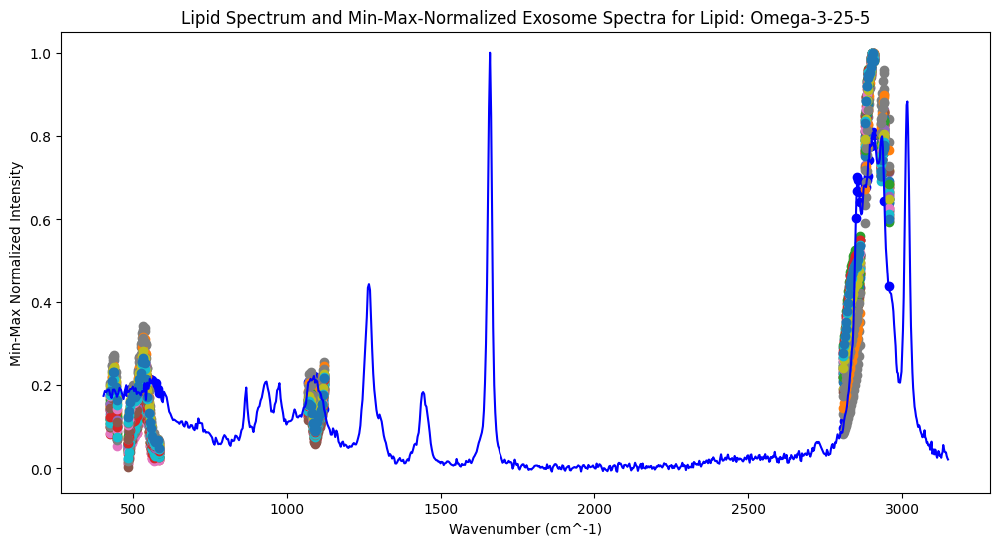

Average Cross-Correlation Score for Lipid: Omega-3-25-5 is 0.9607152156001634


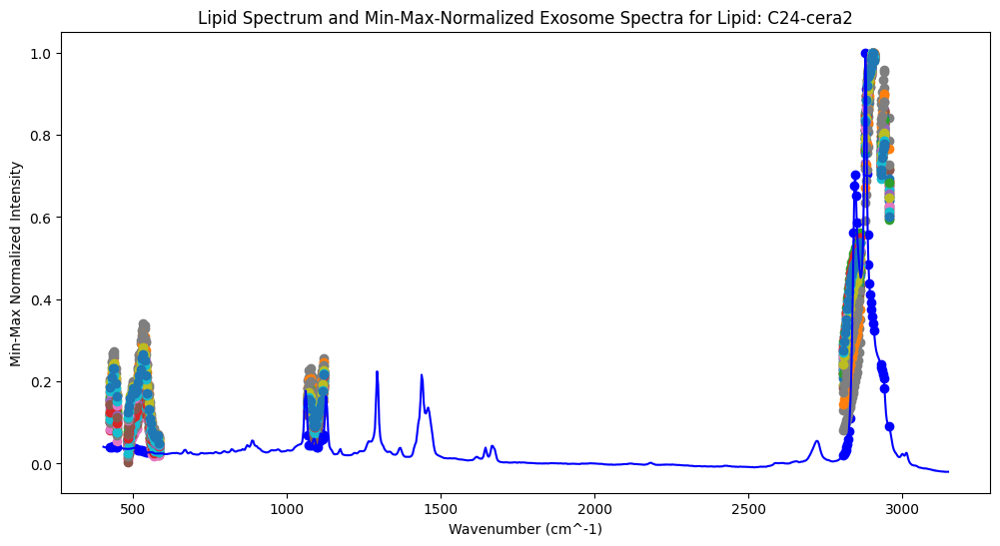

Average Cross-Correlation Score for Lipid: C24-cera2 is 0.819864251697989


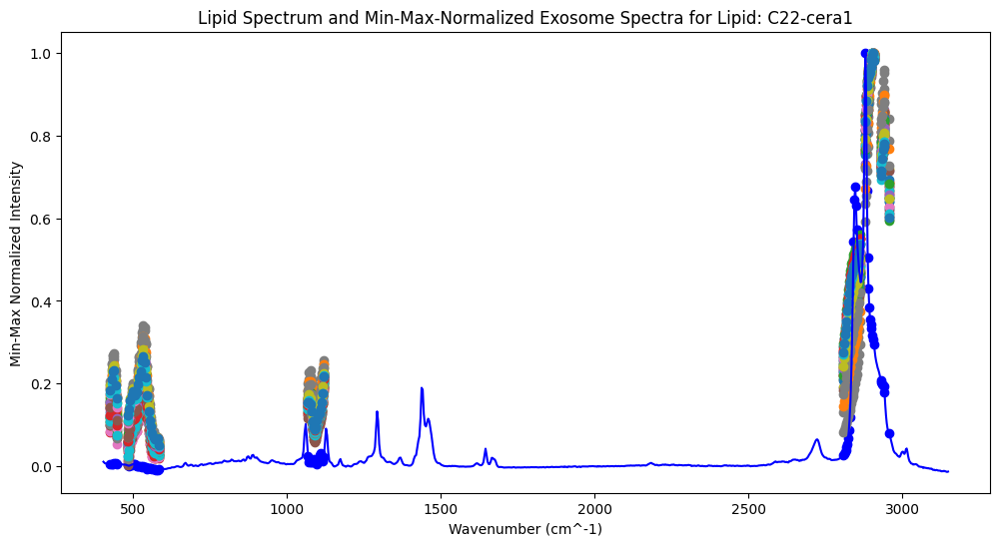

Average Cross-Correlation Score for Lipid: C22-cera1 is 0.7901961174607722


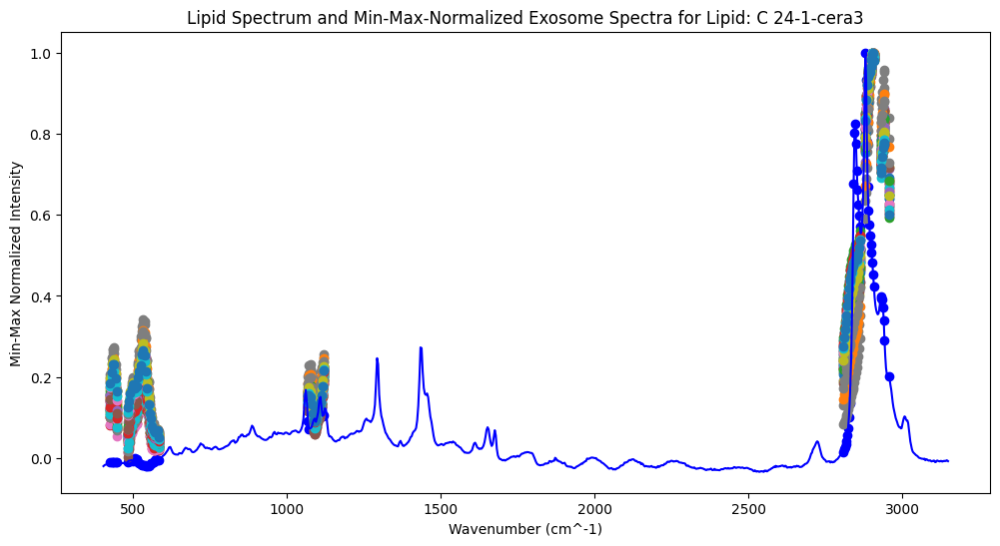

Average Cross-Correlation Score for Lipid: C 24-1-cera3 is 0.8503249608036866


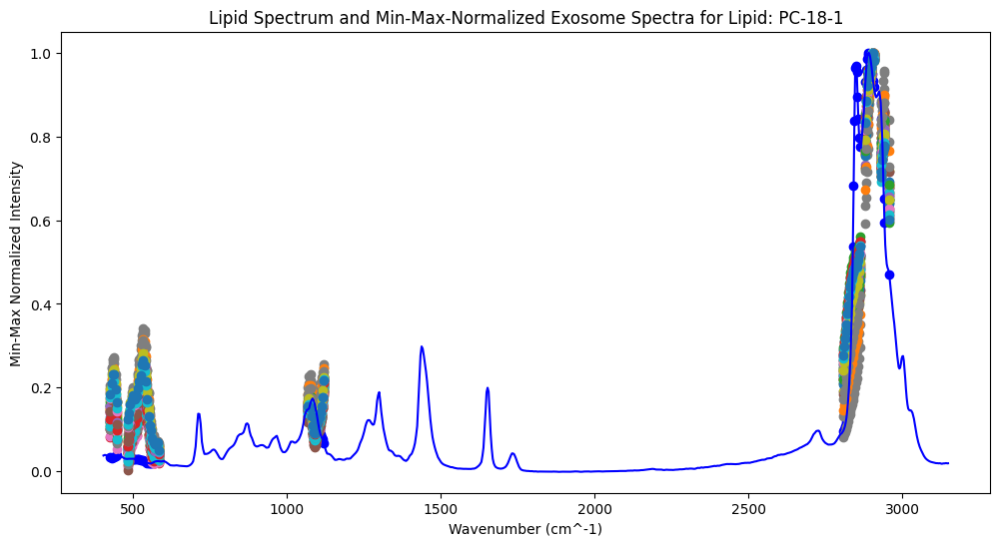

Average Cross-Correlation Score for Lipid: PC-18-1 is 0.9367404735181477


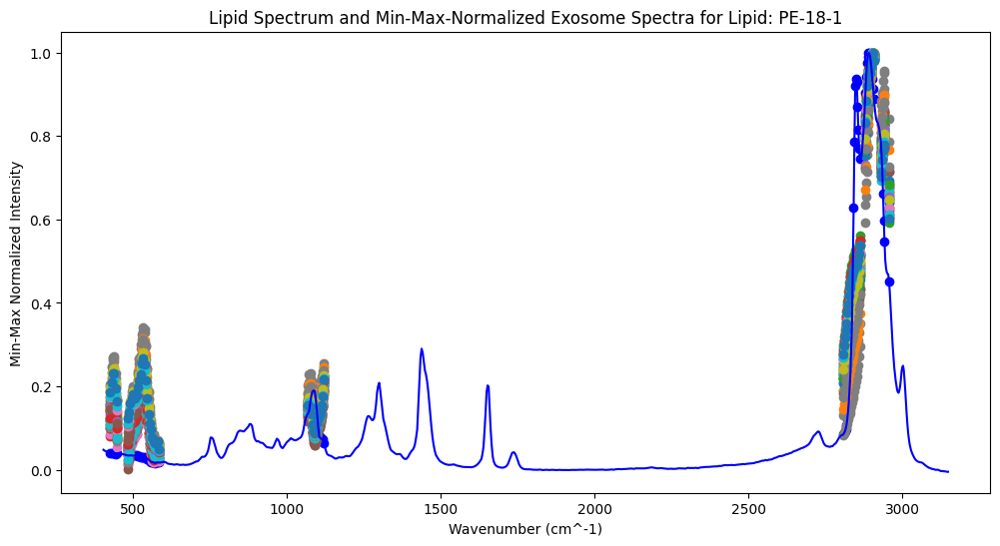

Average Cross-Correlation Score for Lipid: PE-18-1 is 0.9349425375947609


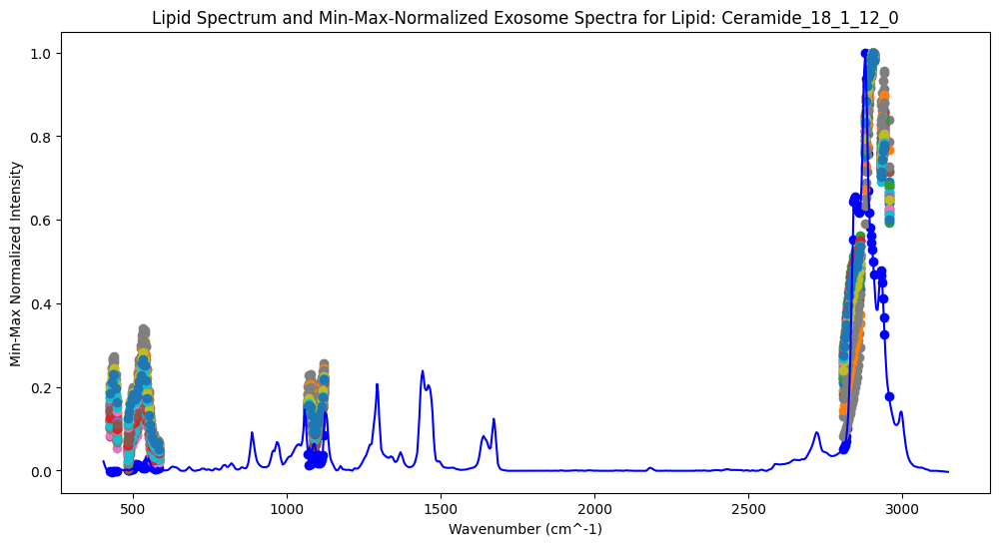

Average Cross-Correlation Score for Lipid: Ceramide_18_1_12_0 is 0.8875551673227557


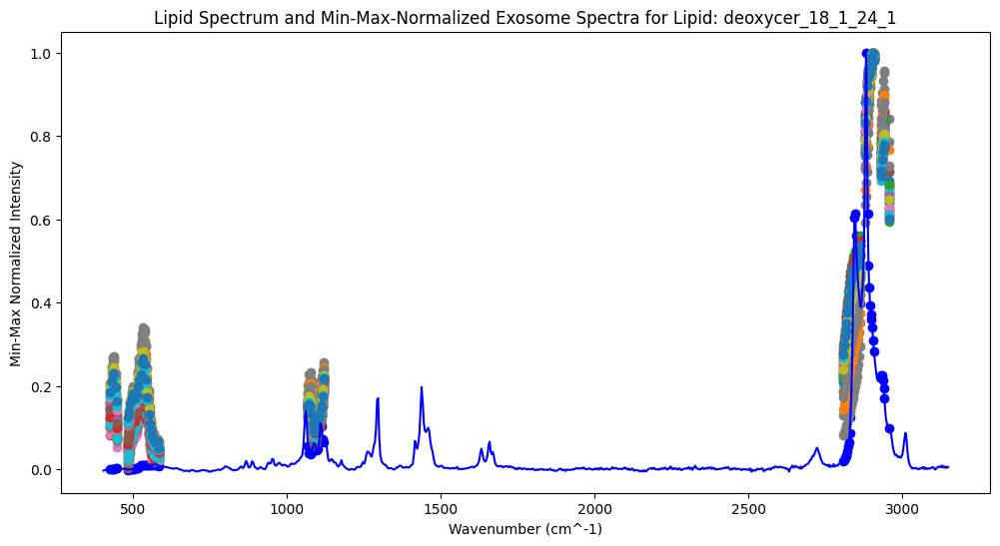

Average Cross-Correlation Score for Lipid: deoxycer_18_1_24_1 is 0.8184705558132972


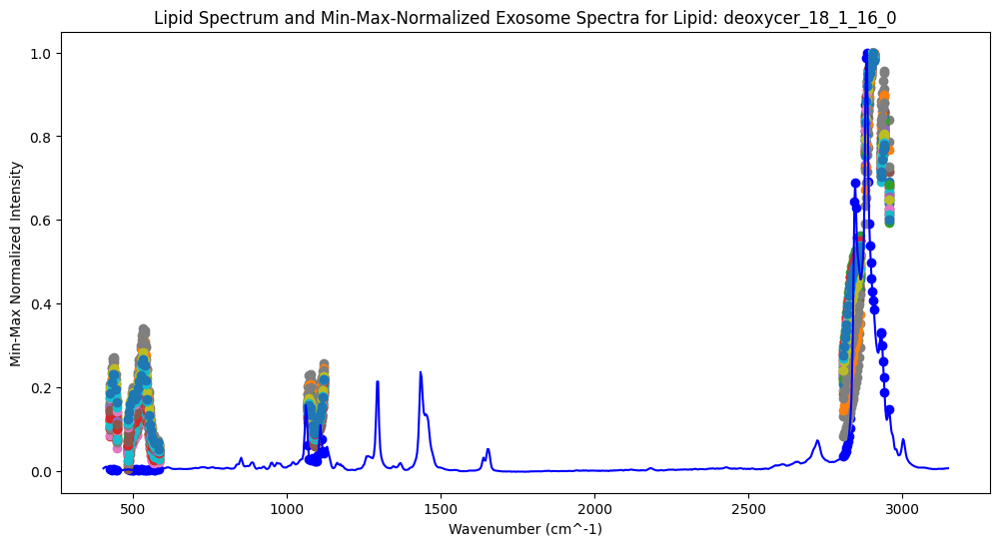

Average Cross-Correlation Score for Lipid: deoxycer_18_1_16_0 is 0.8510611471336264


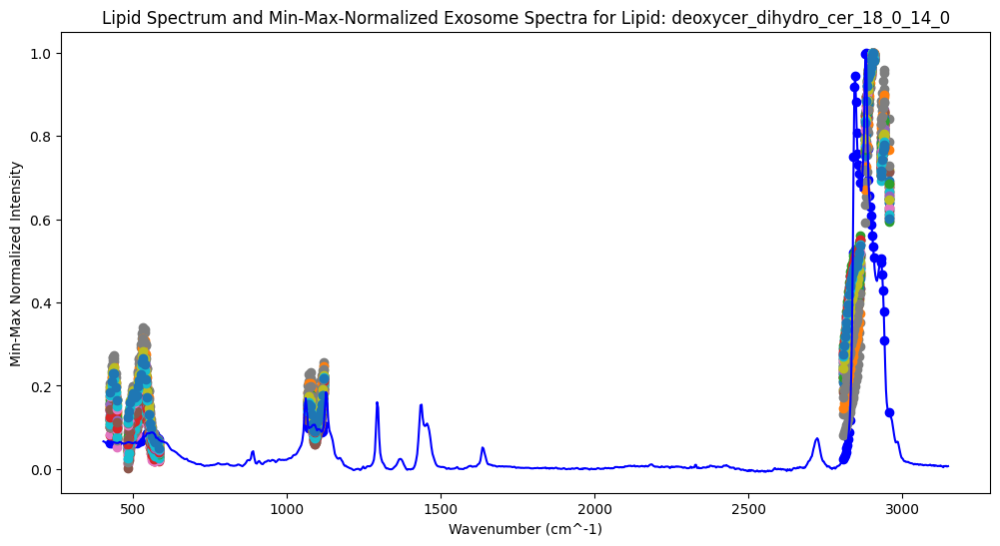

Average Cross-Correlation Score for Lipid: deoxycer_dihydro_cer_18_0_14_0 is 0.8678993224578703

Ranked Average Cross-Correlation Values:
Lipid: Omega-3-25-5, Average Cross-Correlation: 0.9607152156001634
Lipid: Cholesterol, Average Cross-Correlation: 0.9547911380871748
Lipid: Cardiolipin, Average Cross-Correlation: 0.9439587756210968
Lipid: Cholesterol Ester, Average Cross-Correlation: 0.9405847931418088
Lipid: PC-18-1, Average Cross-Correlation: 0.9367404735181477
Lipid: PE-18-1, Average Cross-Correlation: 0.9349425375947609
Lipid: PLS, Average Cross-Correlation: 0.9306286760629118
Lipid: LaPI, Average Cross-Correlation: 0.9300663158665317
Lipid: Phosphatidylcholine, Average Cross-Correlation: 0.9292389188778067
Lipid: TAG, Average Cross-Correlation: 0.9212748601553559
Lipid: LDA, Average Cross-Correlation: 0.919896788610098
Lipid: PE, Average Cross-Correlation: 0.9161059474674237
Lipid: LaPG, Average Cross-Correlation: 0.9144971280998645
Lipid: Ceramide_18_1_12_0, Average Cross-Corr

In [ ]:
#Cross Correlation for Features

# CHOOSE SAMPLE EXOSOME
sample = 'LNCaP'

def compute_crosscor(spectrum1, spectrum2):
    crosscorrelation = correlate(spectrum1, spectrum2, mode='full')
    norm_signal1 = np.sqrt(np.sum(spectrum1**2))
    norm_signal2 = np.sqrt(np.sum(spectrum2**2))
    normalized_crosscorrelation = crosscorrelation / (norm_signal1 * norm_signal2)

    return normalized_crosscorrelation

# Load lipid and exosome data
lipid_file_path = '/content/drive/My Drive/cancer_exosome/MSE/InterpolatedLipids.csv'
exosome_file_path = '/content/drive/My Drive/cancer_exosome/Complete Baseline Corrected Spectra/' + sample + '.csv'

lipid_data = pd.read_csv(lipid_file_path)
exosome_data = pd.read_csv(exosome_file_path)

# Extract lipid wavenumbers and spectra
lipid_wavenumbers = lipid_data.iloc[:, 0].values
lipid_spectra = lipid_data.iloc[:, 1:]

norm_lipid_spectra = np.zeros(lipid_spectra.shape)
for j in range(lipid_spectra.shape[1]):
  temp = np.array(lipid_spectra)[:,j]
  max_index = np.argmax(temp)
  min_index = 444
  norm_temp = min_max_norm(temp, min_index, max_index)
  norm_lipid_spectra[:,j] = norm_temp


# Extract exosome spectra
exosome_wavelengths = exosome_data['Wavenumber'].values
exosome_spectra = exosome_data.iloc[:, 1:]
norm_spectra = np.zeros(exosome_spectra.shape)
for j in range(exosome_spectra.shape[1]):
  temp = np.array(exosome_spectra)[:,j]
  max_index = np.argmax(temp)
  min_index = 444
  norm_temp = min_max_norm(temp, min_index, max_index)
  norm_spectra[:,j] = norm_temp

# Dictionary to store average cross correlation similarity for each lipid
average_correlation_per_lipid = {}

# Process each lipid spectrum
for lipid_idx in range(len(lipid_spectra.columns)):
    lipid_feature_intensities = norm_lipid_spectra[top_indeces,lipid_idx]

    lipid = lipid_feature_intensities
    lipid_s = norm_lipid_spectra[:,lipid_idx]

    # Print lipid SNV spectrum for debugging
    plt.figure(figsize=(12, 6))
    plt.plot(lipid_wavenumbers, lipid_s, label=f'Lipid: {lipid_spectra.columns[lipid_idx]}', color='blue')
    plt.scatter(lipid_wavenumbers[top_indeces], lipid, label=f'Lipid: {lipid_spectra.columns[lipid_idx]}', color='blue')
    plt.title(f'Lipid Spectrum and Min-Max-Normalized Exosome Spectra for Lipid: {lipid_spectra.columns[lipid_idx]}')
    plt.xlabel('Wavenumber (cm^-1)')
    plt.ylabel('Min-Max Normalized Intensity')

    # Process each exosome spectrum
    correlations = []
    for spectrum_idx in range(len(exosome_spectra.columns)):
        exosome_feature_intensities = norm_spectra[top_indeces,spectrum_idx]

        # Normalize exosome spectrum using SNV
        exosome = exosome_feature_intensities

        # Compute Cross-Correlation
        crosscorrelation = compute_crosscor(lipid_snv, exosome)
        max_correlation = np.max(crosscorrelation)
        correlations.append(max_correlation)


        # Plot the SNV normalized exosome spectrum
        plt.scatter(exosome_wavelengths[top_indeces], exosome, label=f'Exosome: {exosome_spectra.columns[spectrum_idx]}')

    plt.show()


    # Compute and store average Cross-Correlation for this lipid
    average_correlation = np.mean(correlations)
    average_correlation_per_lipid[lipid_spectra.columns[lipid_idx]] = average_correlation
    print(f'Average Cross-Correlation Score for Lipid: {lipid_spectra.columns[lipid_idx]} is {average_correlation}')


# Rank and display average Cross-Correlation values
sorted_average_correlation = sorted(average_correlation_per_lipid.items(), key=lambda item: item[1], reverse=True)

print("\nRanked Average Cross-Correlation Values:")
for lipid, avg_correlation in sorted_average_correlation:
    print(f'Lipid: {lipid}, Average Cross-Correlation: {avg_correlation}')

# Save the cross correlation results to a CSV file
correlation_results_df = pd.DataFrame(sorted_average_correlation)
correlation_results_df.to_csv('/content/drive/My Drive/cancer_exosome/Complete Baseline Corrected Spectra/' + sample + '-cross_correlation_results.csv', index=False)

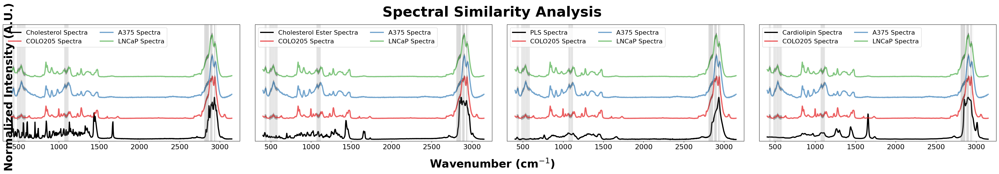

In [ ]:
## pLOT Extracted Features from Lipids vs. Exosome Spectra

lipid_labels = ['Cholesterol', 'Cholesterol Ester', 'PLS', 'Cardiolipin']
sample = ['COLO205', 'A375', 'LNCaP']

colo205_path = '/content/drive/My Drive/cancer_exosome/Complete Baseline Corrected Spectra/COLO205.csv'
a375_path = '/content/drive/My Drive/cancer_exosome/Complete Baseline Corrected Spectra/A375.csv'
lncap_path = '/content/drive/My Drive/cancer_exosome/Complete Baseline Corrected Spectra/LNCaP.csv'

colo_data = pd.read_csv(colo205_path)
a375_data = pd.read_csv(a375_path)
lncap_data = pd.read_csv(lncap_path)

lipid_file_path = '/content/drive/My Drive/cancer_exosome/MSE/InterpolatedLipids.csv'
lipid_data = pd.read_csv(lipid_file_path)

# Extract lipid wavenumbers and spectra
lipid_wavenumbers = lipid_data.iloc[:, 0].values
lipid_spectra = lipid_data.iloc[:, 1:]

norm_lipid_spectra = np.zeros(lipid_spectra.shape)
for j in range(lipid_spectra.shape[1]):
  temp = np.array(lipid_spectra)[:,j]
  max_index = np.argmax(temp)
  min_index = 444
  norm_temp = min_max_norm(temp, min_index, max_index)
  norm_lipid_spectra[:,j] = norm_temp


# Extract exosome spectra
exosome_wavelengths = colo_data['Wavenumber'].values
colo_spectra = np.array(colo_data.iloc[:, 1:])
a375_spectra = np.array(a375_data.iloc[:, 1:])
lncap_spectra = np.array(lncap_data.iloc[:, 1:])
exosome_spectra = np.concatenate([colo_spectra, a375_spectra, lncap_spectra], axis=1)

norm_spectra = np.zeros(exosome_spectra.shape)
for j in range(exosome_spectra.shape[1]):
  temp = exosome_spectra[:,j]
  max_index = np.argmax(temp)
  min_index = 444
  norm_temp = min_max_norm(temp, min_index, max_index)
  norm_spectra[:,j] = norm_temp

rand_int = random.randint(0,colo_spectra.shape[1])
colors = ['#e41a1c', '#377eb8', '#4daf4a']
lipid_idx = [lipid_spectra.columns.get_loc(lipid_name) for lipid_name in lipid_labels]

fig, ax = plt.subplots(1, 4, figsize=(36,6), sharex=True, sharey=True)
plt.axis([exosome_wavelengths[0]-100, exosome_wavelengths[-1]+100, -0.05, 2.75])
vert = 0.5
count = 0
for spectrum_idx in [rand_int, rand_int+58, rand_int+58+40]:
    exosome_spec = norm_spectra[:, spectrum_idx]
    lipid_count = 0
    for axis in ax.flatten():
      if count == 0:
        lipid_feature_intensities = norm_lipid_spectra[top_indeces,lipid_idx[lipid_count]]
        lipid_snv = lipid_feature_intensities
        lipid_s = norm_lipid_spectra[:,lipid_idx[lipid_count]]
        axis.plot(lipid_wavenumbers, lipid_s,alpha=1, label=f'{lipid_spectra.columns[lipid_idx[lipid_count]]} Spectra', color='black', linewidth=3)
      axis.vlines(exosome_wavelengths[top_indeces],-0.05,2.75, color='gray',alpha=0.04)
      axis.vlines(exosome_wavelengths[top_indeces], exosome_spec[top_indeces]+vert-0.05, exosome_spec[top_indeces]+vert+0.05, color='black',alpha=0.2)
      axis.plot(exosome_wavelengths, exosome_spec+vert, alpha=0.7, label=f'{sample[count]} Spectra', color = colors[count], linewidth=3)
      lipid_count +=1
      axis.set_yticks([])
      axis.tick_params(axis='x', labelsize=18)
      axis.legend(fontsize=16,loc='upper left', ncol=2)
    vert += 0.5
    count +=1


fig.suptitle(f'Spectral Similarity Analysis', weight = 'bold', fontsize=36)
fig.supxlabel('Wavenumber (cm$^{-1}$)', weight = 'bold', fontsize=28)
fig.supylabel('Normalized Intensity (A.U.)', weight = 'bold', fontsize=28)
plt.tight_layout()



plt.show()

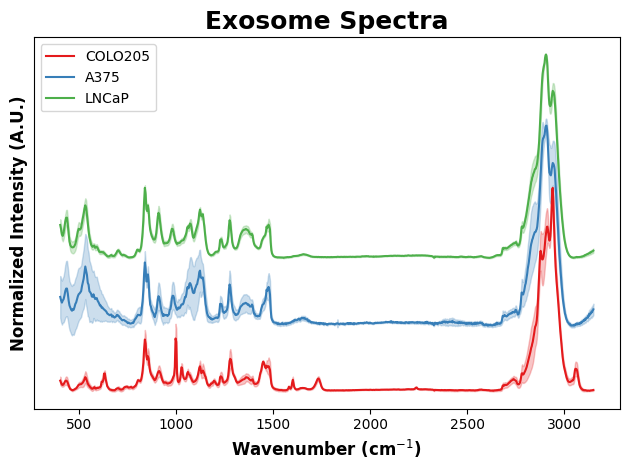

In [ ]:
## Plot mean exosome spectra and standard deviation.
colo_norm_spectra = np.zeros(colo_spectra.shape)
for j in range(colo_spectra.shape[1]):
  temp = colo_spectra[:,j]
  max_index = np.argmax(temp)
  min_index = 444
  norm_temp = min_max_norm(temp, min_index, max_index)
  colo_norm_spectra[:,j] = norm_temp

a375_norm_spectra = np.zeros(a375_spectra.shape)
for j in range(a375_spectra.shape[1]):
  temp = a375_spectra[:,j]
  max_index = np.argmax(temp)
  min_index = 444
  norm_temp = min_max_norm(temp, min_index, max_index)
  a375_norm_spectra[:,j] = norm_temp

lncap_norm_spectra = np.zeros(lncap_spectra.shape)
for j in range(lncap_spectra.shape[1]):
  temp = lncap_spectra[:,j]
  max_index = np.argmax(temp)
  min_index = 444
  norm_temp = min_max_norm(temp, min_index, max_index)
  lncap_norm_spectra[:,j] = norm_temp

colors = ['#e41a1c', '#377eb8', '#4daf4a']
colo_mean = np.mean(colo_norm_spectra,axis=1)
colo_std = np.std(colo_norm_spectra, axis=1)
a375_mean = np.mean(a375_norm_spectra,axis=1)
a375_std = np.std(a375_norm_spectra, axis=1)
lncap_mean = np.mean(lncap_norm_spectra,axis=1)
lncap_std = np.std(lncap_norm_spectra, axis=1)

add1=0.33
add2=0.66

plt.plot(lipid_wavenumbers, colo_mean, color=colors[0], label='COLO205')
plt.fill_between(lipid_wavenumbers, colo_mean+colo_std,colo_mean-colo_std, color=colors[0], alpha=0.25)
#plt.set_yticks([])
plt.legend(loc='upper left')
plt.plot(lipid_wavenumbers, a375_mean+add1, color=colors[1], label='A375')
plt.fill_between(lipid_wavenumbers, a375_mean+a375_std+add1,a375_mean-a375_std+add1, color=colors[1], alpha=0.25)
plt.legend(loc='upper left')
plt.plot(lipid_wavenumbers, lncap_mean+add2, color=colors[2], label='LNCaP')
plt.fill_between(lipid_wavenumbers, lncap_mean+lncap_std+add2,lncap_mean-lncap_std+add2, color=colors[2], alpha=0.25)
plt.legend(loc='upper left')
plt.yticks([])
plt.xlabel('Wavenumber (cm$^{-1}$)', weight = 'bold', fontsize=12)
plt.ylabel('Normalized Intensity (A.U.)', weight = 'bold', fontsize=12)
plt.title('Exosome Spectra', weight='bold',fontsize=18)
plt.tight_layout()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


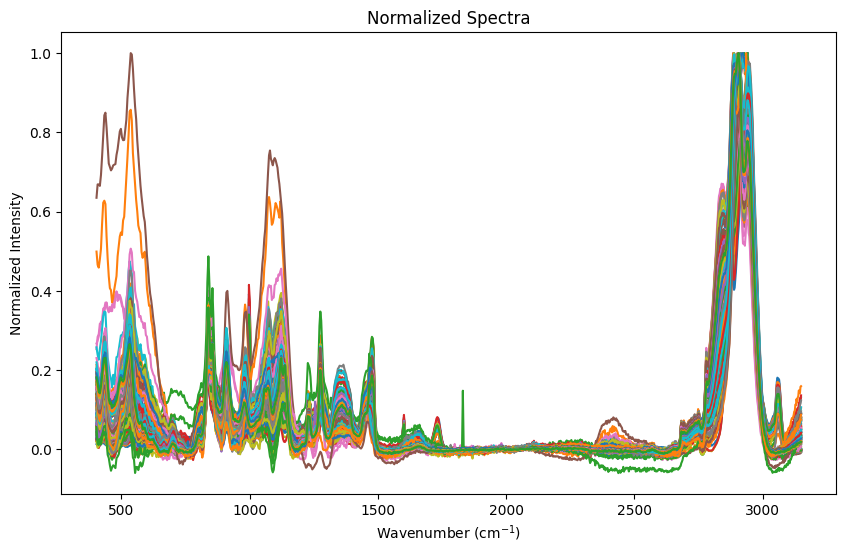

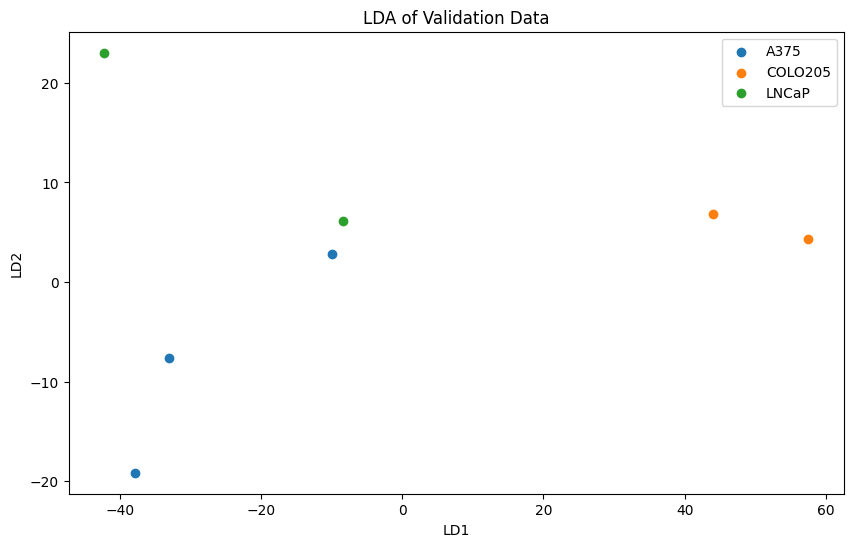

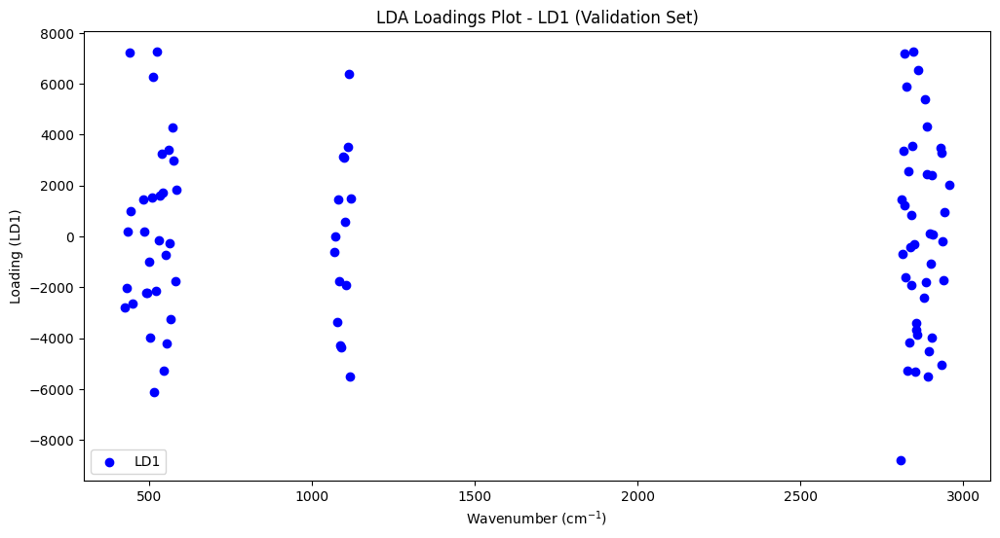

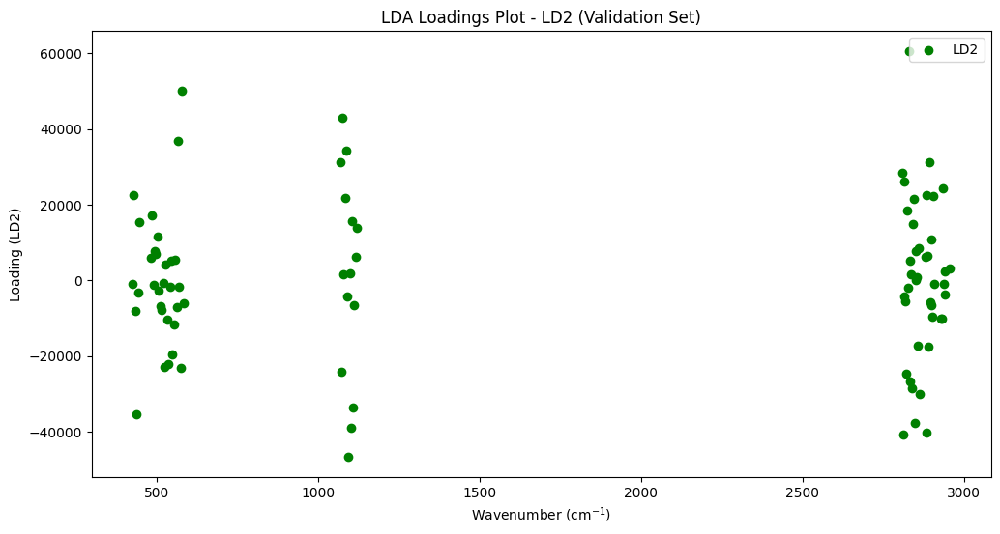

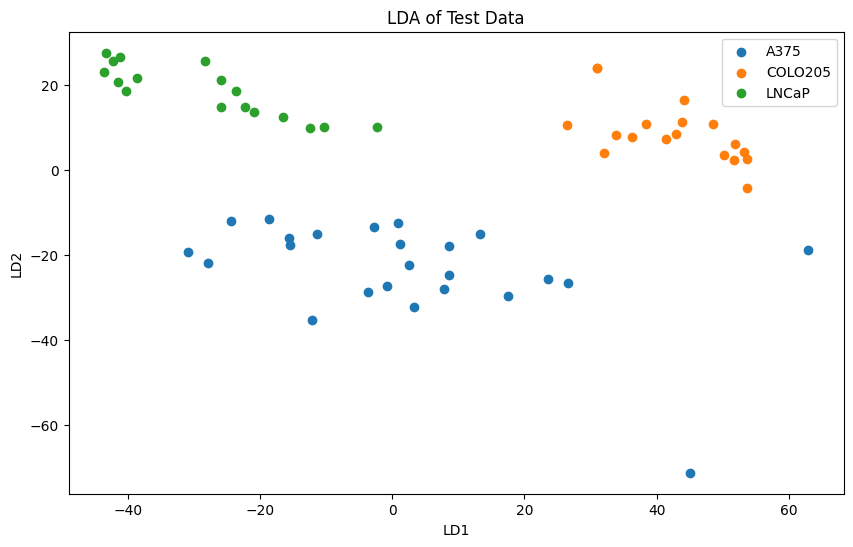

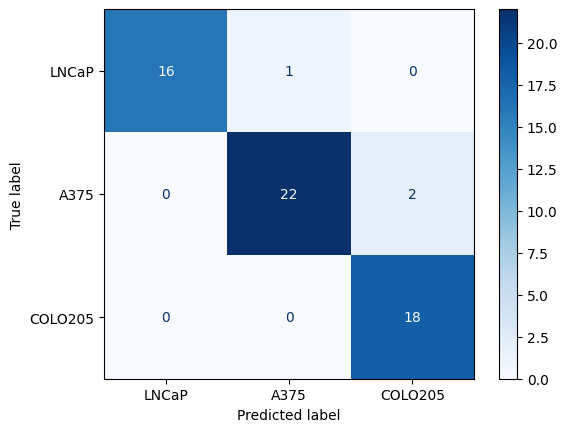

Confusion Matrix:
 [[16  1  0]
 [ 0 22  2]
 [ 0  0 18]]
Classification Report:
               precision    recall  f1-score   support

       LNCaP       1.00      0.94      0.97        17
        A375       0.96      0.92      0.94        24
     COLO205       0.90      1.00      0.95        18

    accuracy                           0.95        59
   macro avg       0.95      0.95      0.95        59
weighted avg       0.95      0.95      0.95        59



NameError: name 'store_accuracy' is not defined

In [ ]:
#LDA Train/Validation/Test (PCA Feature Extraction)

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from google.colab import drive
from sklearn.preprocessing import StandardScaler
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
from sklearn.model_selection import train_test_split

# Load the data
file_path = '/content/drive/My Drive/cancer_exosome/PCA/AllSpectra.csv'
df = pd.read_csv(file_path)

# Extract spectra data
spectra = df.iloc[:, 1:].values
wavenumbers = df.iloc[:, 0].values

norm_spectra = np.zeros(spectra.shape)
for j in range(spectra.shape[1]):
    temp = spectra[:, j]
    max_index = np.argmax(temp)
    min_index = 444  # Preset minimum index, adjust if necessary
    norm_temp = min_max_norm(temp, min_index, max_index)
    norm_spectra[:, j] = norm_temp

# Check that the normalization is correct
plt.figure(figsize=(10, 6))
plt.plot(wavenumbers, norm_spectra)
plt.title('Normalized Spectra')
plt.xlabel('Wavenumber (cm$^{-1}$)')
plt.ylabel('Normalized Intensity')
plt.show()

# First 43 spectra are COLO205, next 59 are A375, and next 41 are LNCaP
n_colo = 43
n_a375 = 59
n_lncap = 41

norm_spectra = norm_spectra[top_indeces]
# Labels
labels = np.array(['COLO205']*n_colo +
                  ['A375']*n_a375 +
                  ['LNCaP']*n_lncap)

test_size = 0.4

# 85% Train/Val then 15% test
X_trainval_colo, X_test_colo, y_trainval_colo, y_test_colo = train_test_split(
    norm_spectra[:, :n_colo].T, labels[:n_colo], test_size=test_size
)
X_trainval_a375, X_test_a375, y_trainval_a375, y_test_a375 = train_test_split(
    norm_spectra[:, n_colo:n_colo+n_a375].T, labels[n_colo:n_colo+n_a375], test_size=test_size
)
X_trainval_lncap, X_test_lncap, y_trainval_lncap, y_test_lncap = train_test_split(
    norm_spectra[:, n_colo+n_a375:].T, labels[n_colo+n_a375:], test_size=test_size
)

val_size = 0.1 * (1 - test_size)

# Perform a 70/15 split on the 85% training/validation data
X_train_colo, X_val_colo, y_train_colo, y_val_colo = train_test_split(
    X_trainval_colo, y_trainval_colo, test_size=val_size  # 15% of 85% ~ 0.1765
)
X_train_a375, X_val_a375, y_train_a375, y_val_a375 = train_test_split(
    X_trainval_a375, y_trainval_a375, test_size=val_size
)
X_train_lncap, X_val_lncap, y_train_lncap, y_val_lncap = train_test_split(
    X_trainval_lncap, y_trainval_lncap, test_size=val_size
)

# Concatenate the train, validation, and test sets for each class
X_train = np.vstack((X_train_colo, X_train_a375, X_train_lncap))
X_val = np.vstack((X_val_colo, X_val_a375, X_val_lncap))
X_test = np.vstack((X_test_colo, X_test_a375, X_test_lncap))

y_train = np.concatenate((y_train_colo, y_train_a375, y_train_lncap))
y_val = np.concatenate((y_val_colo, y_val_a375, y_val_lncap))
y_test = np.concatenate((y_test_colo, y_test_a375, y_test_lncap))

# Train LDA model
lda = LDA()
lda.fit(X_train, y_train)

X_train_lda = lda.transform(X_val)

plt.figure(figsize=(10, 6))
for label in np.unique(y_val):
    mask = (y_val == label)
    plt.scatter(
        X_train_lda[mask, 0],
        X_train_lda[mask, 1],
        label=label
    )
plt.title('LDA of Validation Data')
plt.xlabel('LD1')
plt.ylabel('LD2')
plt.legend()
plt.show()


# Extract the loadings (coefficients) for each discriminant component
loadings = lda.coef_

# Plot the loadings for the first discriminant component (LD1)
plt.figure(figsize=(12, 6))
plt.scatter(wavenumbers[top_indeces], loadings[0], label='LD1', color='blue')
plt.title('LDA Loadings Plot - LD1 (Validation Set)')
plt.xlabel('Wavenumber (cm$^{-1}$)')
plt.ylabel('Loading (LD1)')
plt.legend()
plt.show()

# Plot the loadings for the second discriminant component (LD2)
plt.figure(figsize=(12, 6))
plt.scatter(wavenumbers[top_indeces], loadings[1], label='LD2', color='green')
plt.title('LDA Loadings Plot - LD2 (Validation Set)')
plt.xlabel('Wavenumber (cm$^{-1}$)')
plt.ylabel('Loading (LD2)')
plt.legend()
plt.show()


# Validation Set Scatter Plot
X_val_lda = lda.transform(X_test)

plt.figure(figsize=(10, 6))
for label in np.unique(y_test):
    mask = (y_test == label)
    plt.scatter(
        X_val_lda[mask, 0],
        X_val_lda[mask, 1],
        label=label
    )
plt.title('LDA of Test Data')
plt.xlabel('LD1')
plt.ylabel('LD2')
plt.legend()
plt.show()


# Testing Set
y_pred = lda.predict(X_test)

# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred, labels=['LNCaP', 'A375', 'COLO205'])

# Plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['LNCaP', 'A375', 'COLO205'])
disp.plot(cmap='Blues')
plt.show()

# Print confusion matrix
print("Confusion Matrix:\n", cm)

# Print classification report
report = classification_report(y_test, y_pred, labels=['LNCaP', 'A375', 'COLO205'])
print("Classification Report:\n", report)

report_dict = classification_report(y_test, y_pred, labels=['LNCaP', 'A375', 'COLO205'], output_dict=True)



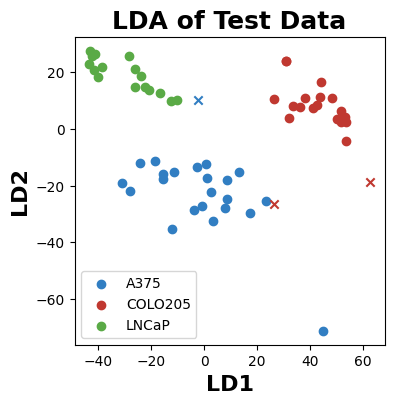

In [ ]:
# Test Set Scatter Plot
colors = [ '#317EC2', '#C03830', '#5AAA46']
X_test_lda = lda.transform(X_test)
y_pred = lda.predict(X_test)
plt.figure(figsize=(4, 4))
count = 0
for label in np.unique(y_test):
    true = (y_test == y_pred)
    false = (y_test != y_pred)
    X_true = X_test_lda[true]
    X_false = X_test_lda[false]
    mask_true = (y_pred[true] == label)
    mask_false = (y_pred[false] == label)
    plt.scatter(
        X_true[mask_true, 0],
        X_true[mask_true, 1], marker='o',
        label=label, color = colors[count]
    )
    plt.scatter(
        X_false[mask_false, 0],
        X_false[mask_false, 1], marker='x',
        color = colors[count]
    )
    count+=1
plt.title('LDA of Test Data', weight='bold',fontsize=18)
plt.xlabel('LD1', weight='bold',fontsize=16)
plt.ylabel('LD2', weight='bold',fontsize=16)
plt.legend()
plt.show()

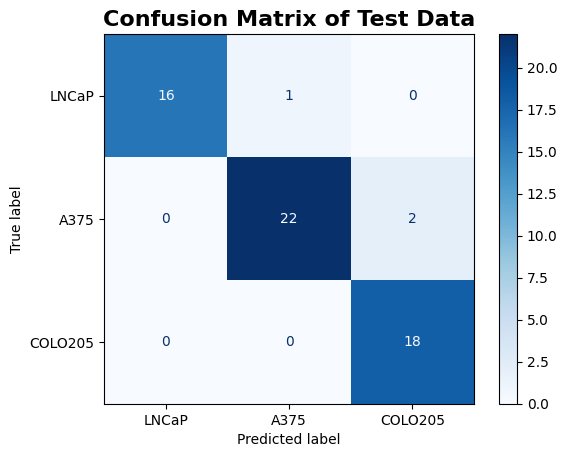

In [ ]:
# Plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['LNCaP', 'A375', 'COLO205'])
disp.plot(cmap='Blues')
plt.title('Confusion Matrix of Test Data', weight='bold', fontsize=16)
plt.show()
